# Brain Tumor Classification and Segmentation

# Introduction

Dataset link: https://figshare.com/articles/dataset/brain_tumor_dataset/1512427?file=7953679

The data set consists of 3064 T1-weighted contrast enhanced images (512 x 512 x 1) from
233 patients with three types of tumors Meningioma (708 slices), Glioma (1426 slices) and Pituitary tumor (930 slices) along with the mask images consisting of the tumor region as shown in the figure.

**Problem Statement**
- Identify the kind of brain tumor from categories : Meningioma, Glioma, Pituitary tumor
- Segment the tumor part from the MRI scans of brain.

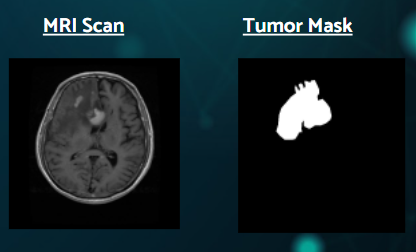

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D,GlobalAveragePooling2D
from tensorflow.keras import models, Model
from tensorflow.keras.layers import Activation,Concatenate, Dropout,UpSampling2D, Flatten, Dense, concatenate,Conv2DTranspose,InputLayer, BatchNormalization, Input, ReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,TensorBoard,ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
from sklearn.preprocessing import normalize
from sklearn.manifold import TSNE
from tensorflow.keras.regularizers import L1,L2,l1_l2
from tensorflow.keras.losses import CategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.models import save_model, load_model
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam,GradcamPlusPlus
from matplotlib import cm
from keras.applications.vgg16 import VGG16 , preprocess_input
from keras.applications import MobileNetV2
import random
import pickle
from PIL import Image
import PIL.Image
from keras import backend as K
import visualkeras
import segmentation_models as sm
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from segmentation_models.losses import bce_jaccard_loss
from segmentation_models.metrics import iou_score

Segmentation Models: using `keras` framework.


In [ ]:
!pip install tf-keras-vis
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.1/52.1 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 7.1 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Visualizing the data with tumor mask

In [ ]:
image_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

In [ ]:
train_img = image_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/train/img/",
                                              target_size=(512,512),
                                              color_mode="grayscale",
                                              class_mode=None,
                                              batch_size=16,
                                              shuffle=False)

train_mask = image_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/train/mask/",
                                               target_size=(512,512),
                                              color_mode="grayscale",
                                               class_mode=None,
                                               batch_size=16,
                                               shuffle=False)

Found 1838 images belonging to 1 classes.
Found 1838 images belonging to 1 classes.


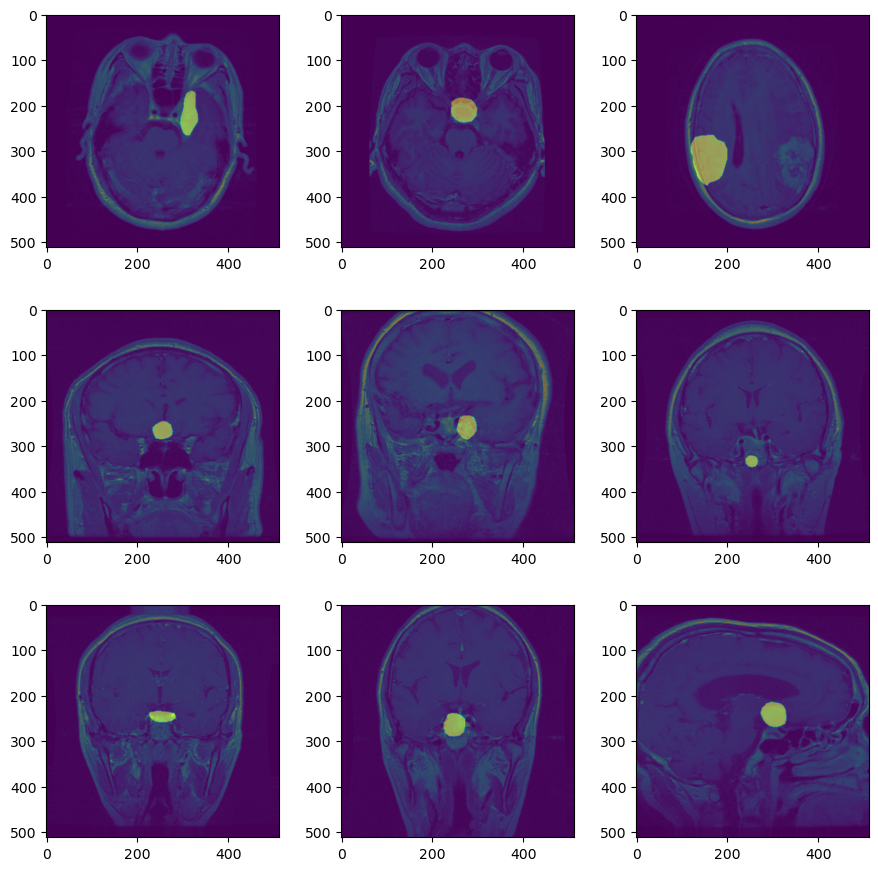

In [ ]:
f,ax = plt.subplots(3,3, figsize=(9,9))
plt.tight_layout()
for i,axs in enumerate(ax.ravel()):
    axs.imshow(train_img[i][1].reshape(512, 512), alpha=1)
    axs.imshow(train_mask[i][1].reshape(512, 512), alpha=0.5)

plt.show()

# 2.Base Models for Classification

## Base Model 1 : Fully connected neural network
Here, we have intially tried to use the fully connected neural network .


In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale = 1/255.0)

In [ ]:
train_img = train_datagen.flow_from_directory(directory="Brain_Tumor_Data/split_data/Images/train/",
                                              target_size=(512,512),
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True)

val_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/split_data/Images/val",
                                              target_size=(512,512),
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True)

test_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/split_data/Images/test",
                                              target_size=(512,512),
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True)

Found 2144 images belonging to 3 classes.
Found 612 images belonging to 3 classes.
Found 308 images belonging to 3 classes.


In [ ]:
class_name = list(train_img.class_indices.keys())
class_name

['Glioma', 'Meningioma', 'Pituitary']

In [ ]:
# initializing the Sequential model API for Feed Forward Network
model1 = Sequential(name='FFNN_model')

# Flattening the input from 3D array to 1D for FFNN model
model1.add(Flatten(input_shape = (512,512,3)))

model1.add(Dense(64,activation='relu'))
model1.add(Dropout(0.3))

model1.add(Dense(64,activation='relu'))
model1.add(Dropout(0.3))

model1.add(Dense(128,activation='relu'))
model1.add(Dropout(0.3))

model1.add(Dense(128,activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.3))

model1.add(Dense(64,activation='relu'))

# Output layer for 3 classes
model1.add(Dense(3, activation='softmax'))

# model summary
model1.summary()

Model: "FFNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 786432)            0         
                                                                 
 dense (Dense)               (None, 64)                50331712  
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 128)               8320      
                                                                 
 dropout_2 (Dropout)         (None, 128)               0

- There is a total of 50,369,667 parameters for this model
- We are going to use early stopping here

In [ ]:
# EarlyStopping with patience = 5
callback = EarlyStopping(patience=5)

# compile the model
model1.compile(optimizer = "adam" , loss="categorical_crossentropy" , metrics = ['accuracy'])

In [ ]:
# fitting the model
history1 = model1.fit(train_img, epochs=10, validation_data=val_img,  callbacks=[callback])

Epoch 1/10
67/67 [==============================] - 175s 3s/step - loss: 1.3216 - accuracy: 0.3899 - val_loss: 1.0432 - val_accuracy: 0.4657
Epoch 2/10
67/67 [==============================] - 170s 3s/step - loss: 1.1796 - accuracy: 0.4184 - val_loss: 1.0448 - val_accuracy: 0.4657
Epoch 3/10
67/67 [==============================] - 170s 3s/step - loss: 1.1282 - accuracy: 0.4408 - val_loss: 1.0843 - val_accuracy: 0.4657
Epoch 4/10
67/67 [==============================] - 168s 3s/step - loss: 1.0819 - accuracy: 0.4743 - val_loss: 0.9992 - val_accuracy: 0.4722
Epoch 5/10
67/67 [==============================] - 170s 3s/step - loss: 1.0519 - accuracy: 0.4986 - val_loss: 0.9307 - val_accuracy: 0.5343
Epoch 6/10
67/67 [==============================] - 169s 3s/step - loss: 1.0098 - accuracy: 0.5434 - val_loss: 0.9166 - val_accuracy: 0.5735
Epoch 7/10
67/67 [==============================] - 170s 3s/step - loss: 1.0217 - accuracy: 0.5289 - val_loss: 0.9499 - val_accuracy: 0.5147
Epoch 8/10
67

In [ ]:
model1.evaluate(test_img)

10/10 [==============================] - 6s 572ms/step - loss: 0.9977 - accuracy: 0.4968


[0.997748613357544, 0.4967532455921173]

***Plotting loss and accuracy***

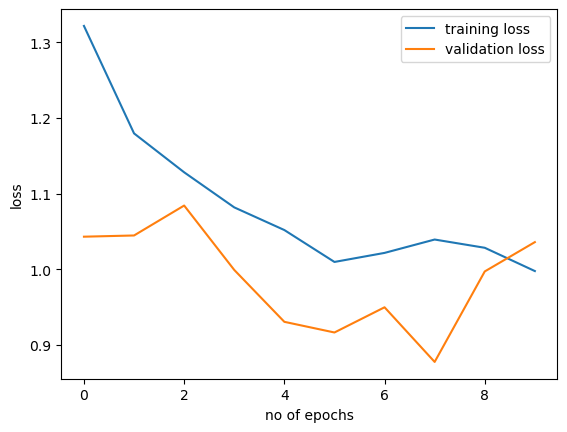

In [ ]:
plt.plot(history1.history['loss'], label='training loss')
plt.plot(history1.history['val_loss'], label='validation loss')
plt.xlabel('no of epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

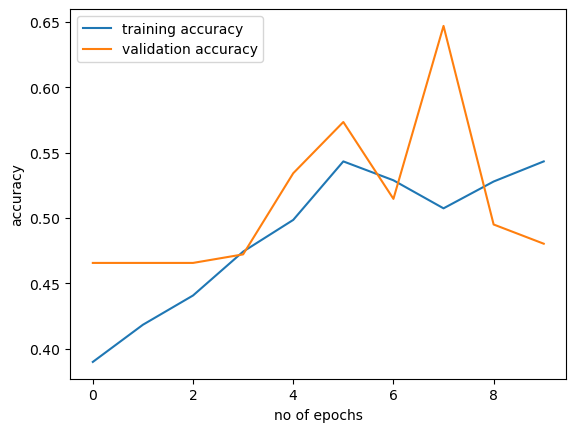

In [ ]:
plt.plot(history1.history['accuracy'], label='training accuracy')
plt.plot(history1.history['val_accuracy'], label='validation accuracy')
plt.xlabel('no of epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

**Inference**
- As, you can observe, the loss and accuracy is very bad
- The accuracy is less than 0.5
- We tried changing the things but the accuracy wasn't improving

## Base Model 2 : Convolutional Neural Network
- Next we tried basic CNN as our base model to see the accuracy of the model

In [ ]:
# initializing the Sequential model API
model2 = Sequential(name='CNN')

# add input layer
model2.add(Input(shape = (512,512,3)))

# add convolutional layers with max pooling
model2.add(Conv2D(filters = 64 , kernel_size = (3,3) , activation = 'relu' , strides=(2,2) , padding='same'))
model2.add(Conv2D(filters = 64 , kernel_size = (3,3) , activation = 'relu' , strides=(2,2) , padding='same'))
model2.add(MaxPooling2D(pool_size = (2,2)))

model2.add(Conv2D(filters = 128 , kernel_size = (3,3) , activation = 'relu' , strides=(2,2) , padding='same'))
model2.add(Conv2D(filters = 128 , kernel_size = (3,3) , activation = 'relu' , strides=(2,2) , padding='same'))
model2.add(MaxPooling2D(pool_size = (2,2)))

model2.add(Conv2D(filters = 256 , kernel_size = (3,3) , activation = 'relu' , strides=(2,2) , padding='same'))
model2.add(Conv2D(filters = 256 , kernel_size = (3,3) , activation = 'relu' , strides=(2,2) , padding='same'))
model2.add(MaxPooling2D(pool_size = (2,2)))

# add fully connected layers
model2.add(Flatten())
model2.add(Dense(units=256,activation="relu"))
model2.add(Dense(units=64,activation="relu"))
model2.add(Dense(units=len(class_name), activation="softmax"))

# model summary
model2.summary()

Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 64)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 8, 128)        0         
 2D)                                                           

- There is a total of 1,227,843 parameters in this model

In [ ]:
# COMPILE THE MODEL
opt = Adam(learning_rate = 0.001)
model2.compile(optimizer=opt , loss = "categorical_crossentropy" , metrics = ['accuracy'])

In [ ]:
# EarlyStopping with patience = 5
callback = EarlyStopping(patience=5)



# fitting the model
his2 = model2.fit(train_img,
                  batch_size = 32,
                  epochs = 10,
                  validation_data = val_img,
                  steps_per_epoch = len(train_img),
                  validation_steps = len(val_img),
                  callbacks=[callback])

Epoch 1/10
67/67 [==============================] - 345s 5s/step - loss: 0.9728 - accuracy: 0.5476 - val_loss: 0.7776 - val_accuracy: 0.6585
Epoch 2/10
67/67 [==============================] - 321s 5s/step - loss: 0.8281 - accuracy: 0.6236 - val_loss: 0.7650 - val_accuracy: 0.6716
Epoch 3/10
67/67 [==============================] - 321s 5s/step - loss: 0.7725 - accuracy: 0.6493 - val_loss: 0.6490 - val_accuracy: 0.7337
Epoch 4/10
67/67 [==============================] - 321s 5s/step - loss: 0.6591 - accuracy: 0.7080 - val_loss: 0.6527 - val_accuracy: 0.6944
Epoch 5/10
67/67 [==============================] - 320s 5s/step - loss: 0.6349 - accuracy: 0.7146 - val_loss: 0.5596 - val_accuracy: 0.7680
Epoch 6/10
67/67 [==============================] - 322s 5s/step - loss: 0.5643 - accuracy: 0.7621 - val_loss: 0.5208 - val_accuracy: 0.7876
Epoch 7/10
67/67 [==============================] - 322s 5s/step - loss: 0.5209 - accuracy: 0.7705 - val_loss: 0.5142 - val_accuracy: 0.7712
Epoch 8/10
67

In [ ]:
model2.evaluate(test_img)

10/10 [==============================] - 7s 680ms/step - loss: 0.3763 - accuracy: 0.8247


[0.3763318955898285, 0.8246753215789795]

In [ ]:
model2.save("Models/model_cnn_v1.h5")

***Plotting loss and accuracy***

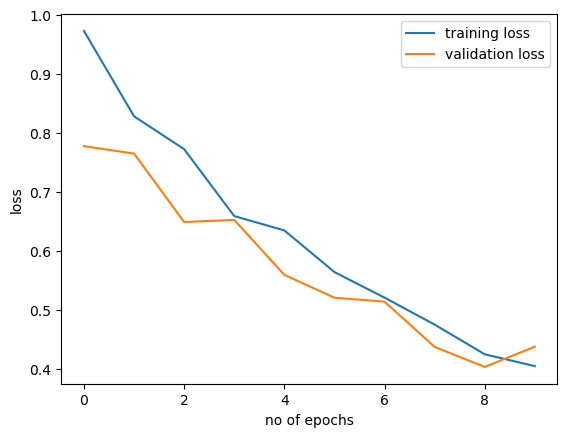

In [ ]:
plt.plot(his2.history['loss'], label='training loss')
plt.plot(his2.history['val_loss'], label='validation loss')
plt.xlabel('no of epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

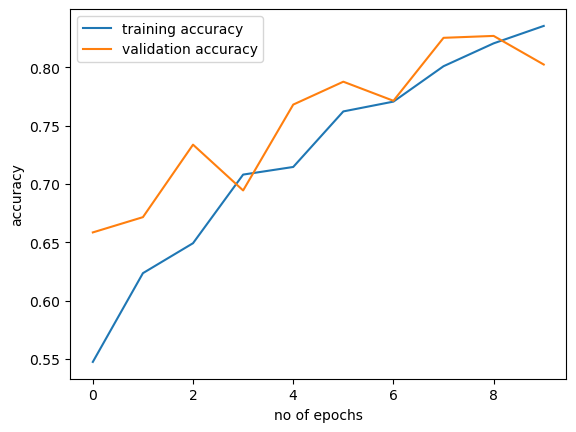

In [ ]:
plt.plot(his2.history['accuracy'], label='training accuracy')
plt.plot(his2.history['val_accuracy'], label='validation accuracy')
plt.xlabel('no of epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

**Inference**
- As we can observe it is giving not good accuracy but per epochs our accuracy gradually increase if we use more epochs there is chance to increace accuracy.
- Let's try with more epochs

In [ ]:
model2 = keras.models.load_model("Models/model_cnn_v1.h5",compile=False)

In [ ]:
# COMPILE THE MODEL
opt = Adam(learning_rate = 0.001)
model2.compile(optimizer=opt , loss = "categorical_crossentropy" , metrics = ['accuracy'])

In [ ]:
# EarlyStopping with patience = 5
callback = EarlyStopping(patience=5)

# Reduce learning rate when a metric has stopped improving.
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose = 1)

# fitting the model
his3 = model2.fit(train_img,
                  batch_size = 32,
                  epochs = 15,
                  validation_data = val_img,
                  steps_per_epoch = len(train_img),
                  validation_steps = len(val_img),
                  callbacks=[callback,reduce_lr])

Epoch 1/15
67/67 [==============================] - 332s 5s/step - loss: 0.3812 - accuracy: 0.8377 - val_loss: 0.3729 - val_accuracy: 0.8366 - lr: 0.0010
Epoch 2/15
67/67 [==============================] - 319s 5s/step - loss: 0.3609 - accuracy: 0.8554 - val_loss: 0.5045 - val_accuracy: 0.7745 - lr: 0.0010
Epoch 3/15
67/67 [==============================] - 322s 5s/step - loss: 0.3456 - accuracy: 0.8587 - val_loss: 0.3334 - val_accuracy: 0.8758 - lr: 0.0010
Epoch 4/15
67/67 [==============================] - 319s 5s/step - loss: 0.3189 - accuracy: 0.8680 - val_loss: 0.3311 - val_accuracy: 0.8742 - lr: 0.0010
Epoch 5/15
67/67 [==============================] - 366s 5s/step - loss: 0.2998 - accuracy: 0.8848 - val_loss: 0.3609 - val_accuracy: 0.8644 - lr: 0.0010
Epoch 6/15
67/67 [==============================] - 336s 5s/step - loss: 0.2873 - accuracy: 0.8825 - val_loss: 0.2815 - val_accuracy: 0.8971 - lr: 0.0010
Epoch 7/15
67/67 [==============================] - 330s 5s/step - loss: 0.2

In [ ]:
# Evaluating the model
loss, accuracy = model2.evaluate(test_img)
print(f"Test Loss: {loss:0.5f}")
print(f"Test Accuracy: {accuracy:0.5f}")

10/10 [==============================] - 8s 737ms/step - loss: 0.2315 - accuracy: 0.9123
Test Loss: 0.23146
Test Accuracy: 0.91234


***Plotting loss and accuracy***

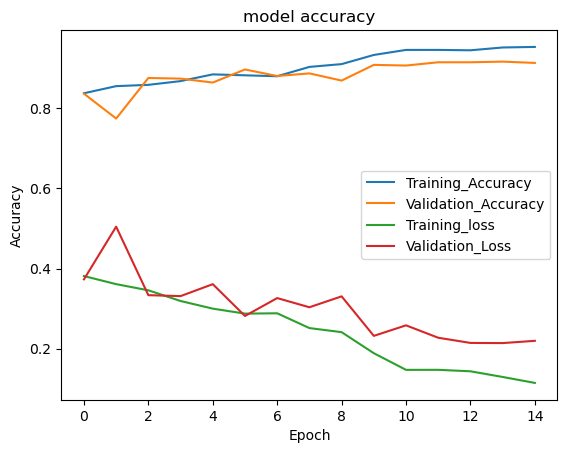

In [ ]:
plt.plot(his3.history["accuracy"])
plt.plot(his3.history['val_accuracy'])
plt.plot(his3.history['loss'])
plt.plot(his3.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Training_Accuracy","Validation_Accuracy","Training_loss","Validation_Loss"])
plt.show()

**Inference**
- As we can observe it is giving good accuracy but try to increase more
- Let's try with Pretrained models

In [ ]:
model2.save("Models/model_cnn_v11.h5")

***Function for prediction***

In [ ]:
def prediction_test_sample(model , test_data):
    class_name = ['Glioma', 'Meningioma', 'Pituitary']

    for images , labels in iter(test_data):
        fig ,ax = plt.subplots(3 ,3,figsize=(9,9))
        axs = ax.ravel()

        for i in range(9):

            axs[i].imshow(images[i])
            # convert img to array
            img = tf.keras.utils.img_to_array(images[i])
            # convert into (1,512,512,3)
            img = tf.expand_dims(img,axis = 0)

            # prediction
            prediction = model.predict(img,verbose=0)

            prediction_class = class_name[np.argmax(prediction[0])]

            # actual label
            actual_label = class_name[np.argmax(labels[i])]

            axs[i].set_title(f"actual : {actual_label} \n predicted : {prediction_class}")


        plt.tight_layout()
        break

***Prediction on test data***

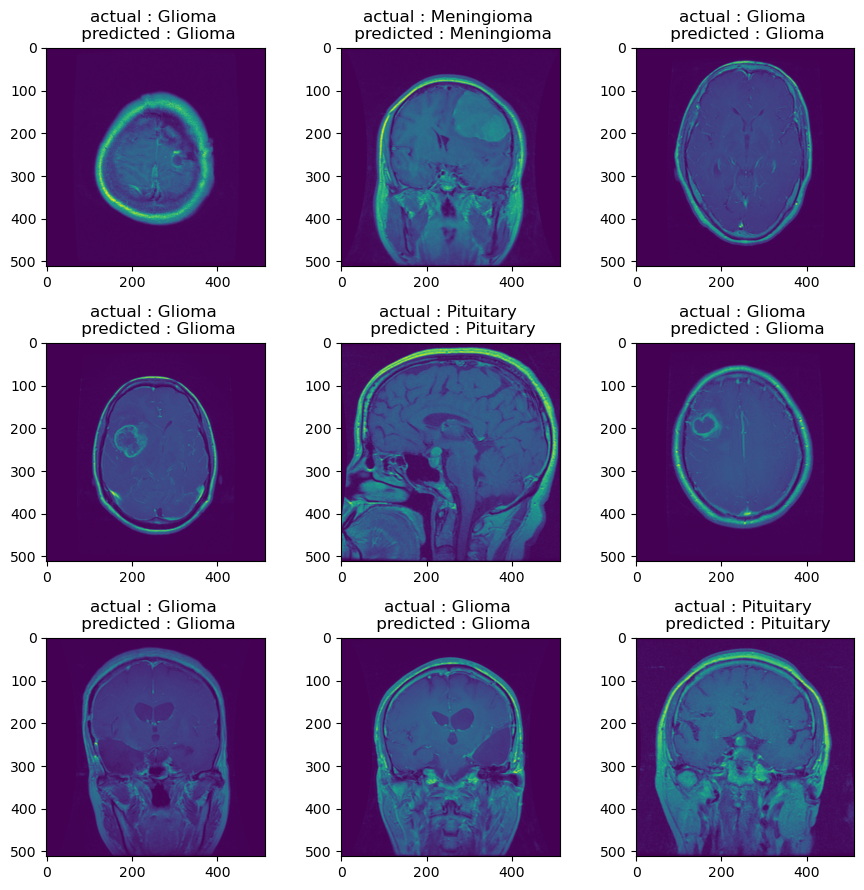

In [ ]:
prediction_test_sample(model2 , test_img)

***Prediction on val data***

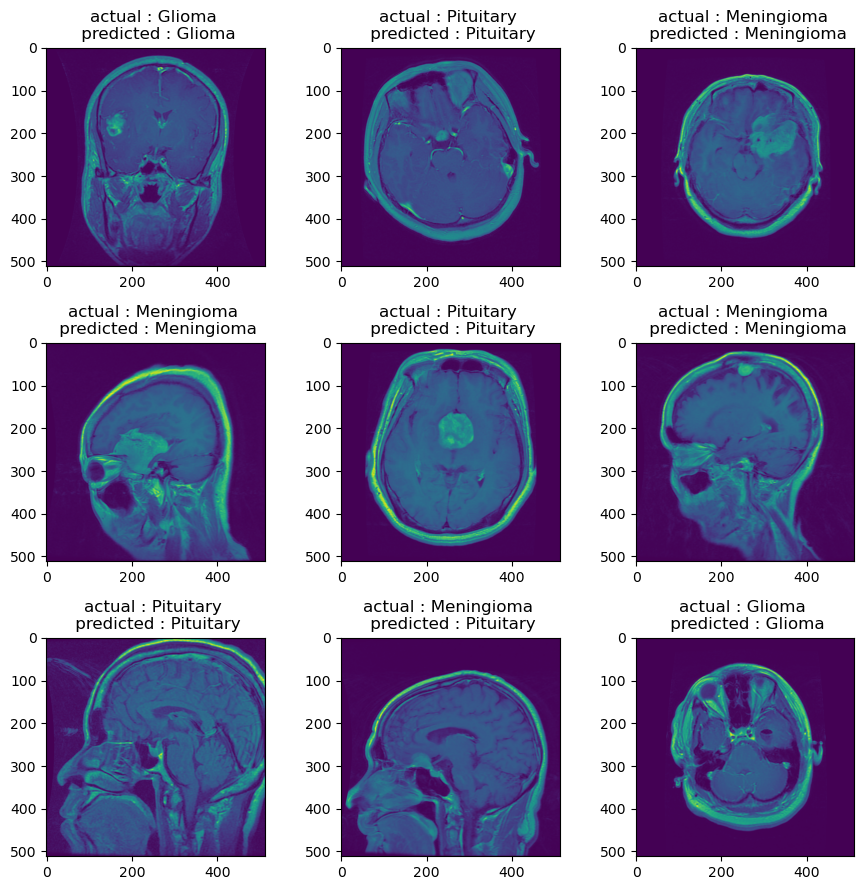

In [ ]:
prediction_test_sample(model2, val_img)

# Base Model 4 : MobileNetV2 (Pretrained Model)

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1/255.0)

train_img = train_datagen.flow_from_directory(directory="Brain_Tumor_Data/split_data/Images/train",
                                              target_size=(224,224),
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True)

val_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/split_data/Images/val",
                                              target_size=(224,224),
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True)

test_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/split_data/Images/test",
                                              target_size=(224,224),
                                              class_mode='categorical',
                                              batch_size=32,
                                              shuffle=True)

Found 2144 images belonging to 3 classes.
Found 612 images belonging to 3 classes.
Found 308 images belonging to 3 classes.


In [ ]:
base_mobilenet = MobileNetV2(include_top=False , weights="imagenet" , input_shape=(224,224,3))

In [ ]:
# freeze the trainable params
for layer in base_mobilenet.layers:
    layer.trainable=False

In [ ]:
base_in = base_mobilenet.output
flat = Flatten()(base_in)
dense1 = Dense(256, activation='relu')(flat)
output= Dense(3, activation='softmax')(dense1)

model_mobilenet = Model(inputs = base_mobilenet.input , outputs=output)

In [ ]:
model_mobilenet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model_mobilenet.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
# # EarlyStopping with patience = 8
early = EarlyStopping(monitor='val_loss',patience=8, verbose=1)

# checkpoint = ModelCheckpoint("model_vgg16.h5", monitor='val_loss', verbose=1, save_best_only=True,mode='min')

# Reduce learning rate when a metric has stopped improving.
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=4, verbose = 1)

# fitting the model
his = model_mobilenet.fit(train_img,
                  batch_size = 32,
                  epochs = 30,
                  validation_data = val_img,
                  steps_per_epoch = len(train_img),
                  validation_steps = len(val_img),
                  callbacks = [early,reduce_lr])

Epoch 1/30
67/67 [==============================] - 92s 1s/step - loss: 4.3080 - accuracy: 0.7514 - val_loss: 0.9068 - val_accuracy: 0.8235 - lr: 0.0010
Epoch 2/30
67/67 [==============================] - 87s 1s/step - loss: 0.5828 - accuracy: 0.8517 - val_loss: 0.9583 - val_accuracy: 0.8137 - lr: 0.0010
Epoch 3/30
67/67 [==============================] - 84s 1s/step - loss: 0.4519 - accuracy: 0.8750 - val_loss: 0.5046 - val_accuracy: 0.8513 - lr: 0.0010
Epoch 4/30
67/67 [==============================] - 86s 1s/step - loss: 0.3306 - accuracy: 0.8899 - val_loss: 0.2663 - val_accuracy: 0.8889 - lr: 0.0010
Epoch 5/30
67/67 [==============================] - 86s 1s/step - loss: 0.2102 - accuracy: 0.9198 - val_loss: 0.3520 - val_accuracy: 0.8742 - lr: 0.0010
Epoch 6/30
67/67 [==============================] - 86s 1s/step - loss: 0.2433 - accuracy: 0.9137 - val_loss: 0.2683 - val_accuracy: 0.8873 - lr: 0.0010
Epoch 7/30
67/67 [==============================] - 84s 1s/step - loss: 0.1508 - a

In [ ]:
model_mobilenet.save("Models/model_mobilenet1.h5")

In [ ]:
# Evaluating the model
loss, accuracy = model_mobilenet.evaluate(test_img)
print(f"Test Loss: {loss:0.5f}")
print(f"Test Accuracy: {accuracy:0.5f}")

10/10 [==============================] - 6s 601ms/step - loss: 0.2068 - accuracy: 0.9221
Test Loss: 0.20684
Test Accuracy: 0.92208


***Plotting loss and accuracy***

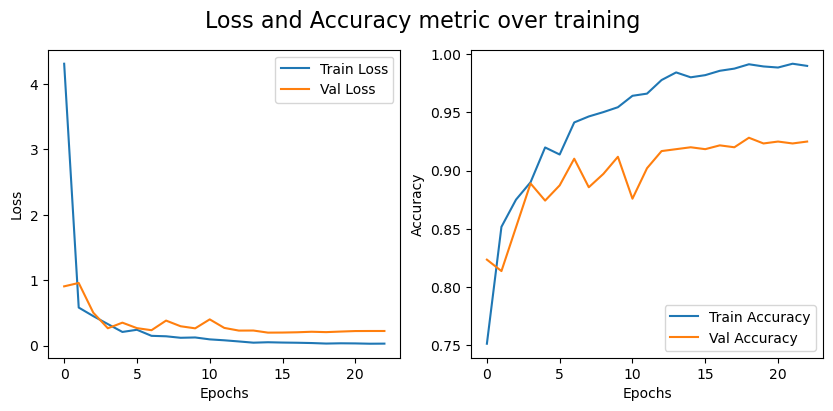

In [ ]:
f,ax = plt.subplots(1,2, figsize=(10, 4))
f.suptitle('Loss and Accuracy metric over training', fontsize=16)

ax[0].plot(his.history['loss'], label="Train Loss")
ax[0].plot(his.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")


ax[1].plot(his.history['accuracy'], label="Train Accuracy")
ax[1].plot(his.history['val_accuracy'], label="Val Accuracy")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")

ax[0].legend()
ax[1].legend()
plt.show()

***Prediction on test data***

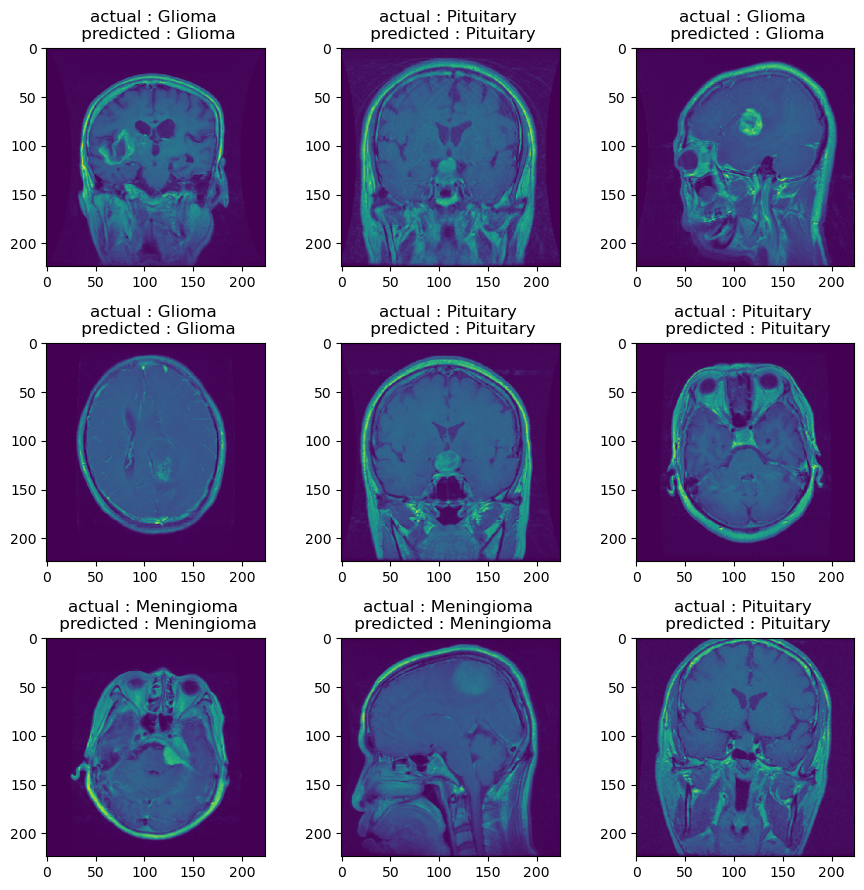

In [ ]:
prediction_test_sample(model_mobilenet , test_img)

***Prediction on val data***

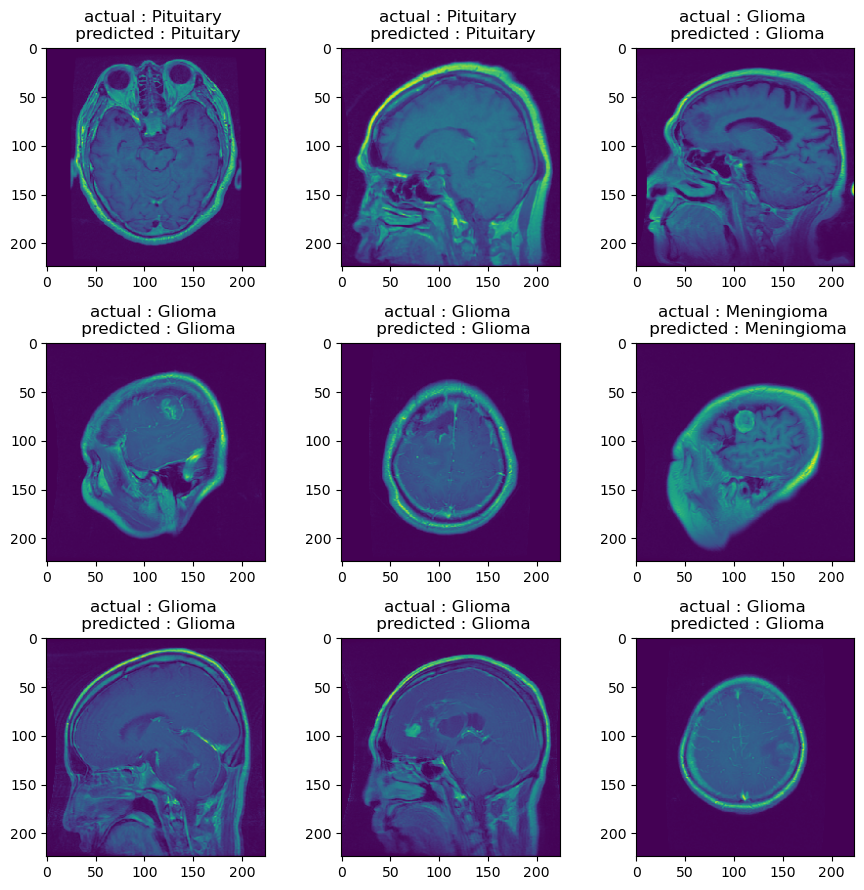

In [ ]:
prediction_test_sample(model_mobilenet , val_img)

**Inference**
- As you can observe it is giving good accuracy
- But we don't know whether it's because of the tumor or the whole brain data itself
- Since, the aim is to predict the tumor based on the tumor data we need to check from what it is predicting from
- So we are doing some saliency maps to see how our model is predicting the results

**Saliency maps**
- We are checking the smoothgrad and gradcam of this model to see from what part of the pixels the model is classifying the data

In [ ]:
img = val_img[2][0][6]
replace2linear = ReplaceToLinear()
score = CategoricalScore([1])

In [ ]:
# Saliency map
saliency = Saliency(model=model_mobilenet,
                    model_modifier=replace2linear)

saliency_map = saliency(score,
                        img,
                        smooth_samples=2,
                        smooth_noise=0.04)


# GradCAM++
gradcamplus = GradcamPlusPlus(model=model_mobilenet,
                              model_modifier=replace2linear,
                              clone=True)

g_camplus = gradcamplus(score,
                img,
                penultimate_layer=-1)

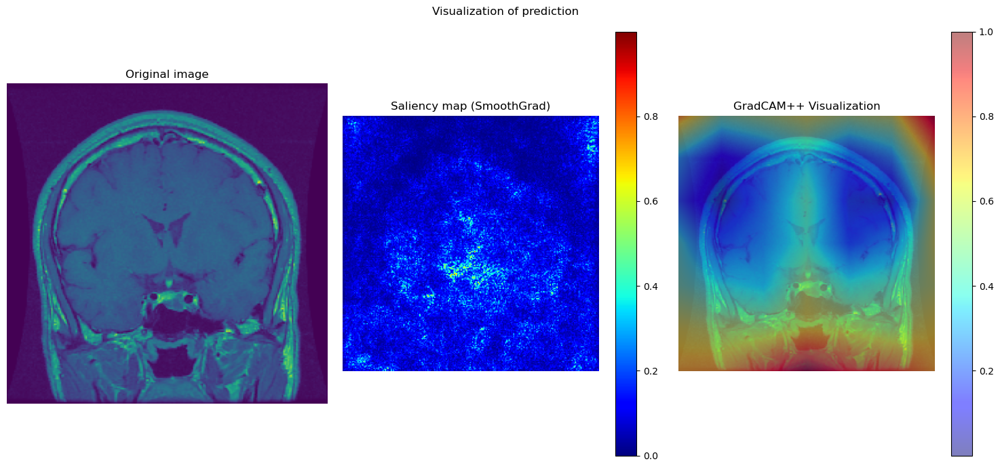

In [ ]:
plt.figure(figsize=(15,7))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title('Original image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(saliency_map[0], cmap='jet')
plt.title('Saliency map (SmoothGrad)')
plt.colorbar()
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(img)
plt.imshow(1-g_camplus.squeeze(), cmap='jet', alpha=0.5)
plt.title('GradCAM++ Visualization')
plt.colorbar()
plt.axis('off')


plt.suptitle("Visualization of prediction")
plt.tight_layout()
plt.show()

***lets try with model2 (base model 2)***

In [ ]:
model2 = keras.models.load_model("Models/model_cnn_v11.h5")

In [ ]:
img = val_img[2][0][5]
replace2linear = ReplaceToLinear()
score = CategoricalScore([1])

In [ ]:
# Saliency map
saliency = Saliency(model=model2,
                    model_modifier=replace2linear)

saliency_map = saliency(score,
                        img,
                        smooth_samples=2,
                        smooth_noise=0.04)


# GradCAM++
gradcamplus = GradcamPlusPlus(model=model2,
                              model_modifier=replace2linear,
                              clone=True)

g_camplus = gradcamplus(score,
                img,
                penultimate_layer=-1)

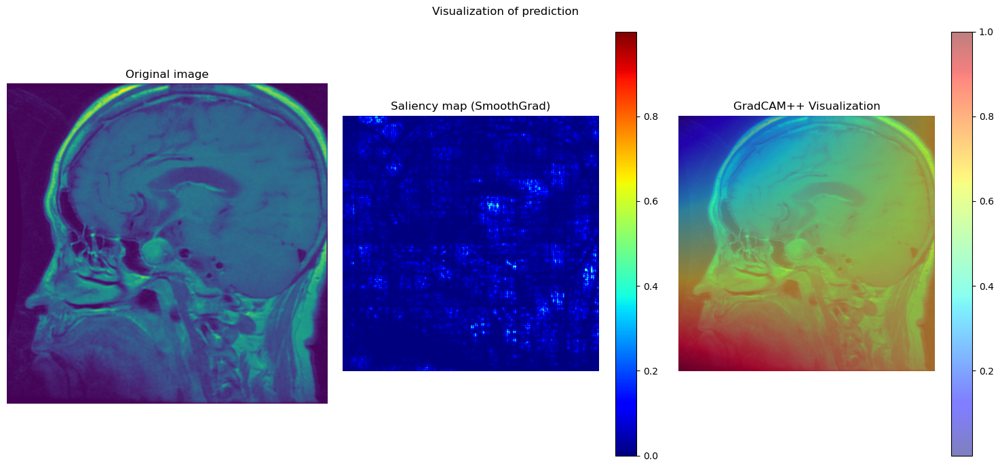

In [ ]:
plt.figure(figsize=(15,7))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title('Original image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(saliency_map[0], cmap='jet')
plt.title('Saliency map (SmoothGrad)')
plt.colorbar()
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(img)
plt.imshow(1-g_camplus.squeeze(), cmap='jet', alpha=0.5)
plt.title('GradCAM++ Visualization')
plt.colorbar()
plt.axis('off')


plt.suptitle("Visualization of prediction")
plt.tight_layout()
plt.show()

**Inference**
- From the above figures we can observe that it takes the whole image of brain to predict the tumor (we observed the same with other images too)
- But what we want is the to find the tumor area and use it for prediction
- So,  we will be doing the segmentation of the tumor from the brain mri using the tumor mask to get the information of the tumor rather than of the whole image

# Losses Used
**Why we need a different loss??** \
*As per above tumor mask, we can see that about 80% of the image is background or not a tumor part. Therefor using binary crossentropy did not seem to be optimal. Therefore we have used multiple loss with combining them to increase the effects of each of them.*

#### Dice Loss
Dice loss is a loss function that is used to address data imbalance in medical image segmentation.
In practice, the Dice loss is often used as a loss function for training neural networks for segmentation tasks.

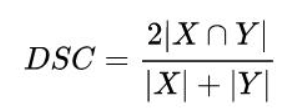

The idea behind the dice loss is that we calculate the intersection between actual and predicted segment of tumor. DCE is the dice co-efficient which is the intersection divided by sum of actual and predicted mask. when predicted and actual mask is equal then DCE becomes 1. So we calculate the loss by 1 - DCE.

In [ ]:
def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return dice

In [ ]:
def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true,y_pred)

#### Focal Loss
The focal loss as name suggests used for focusing on incorrect prediction.

#### Focal Loss = -α * (1 - p)^γ * log(p)

Where:

α is a hyperparameter that balances the importance of positive and negative examples. It is typically set to a value like 0.25 for imbalanced datasets.

p is the predicted probability of the true class (i.e., the class predicted by the model).

γ is another hyperparameter called the focusing parameter, which controls the rate at which easy examples are downweighted. A typical value for γ is 2.

In [ ]:
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1+K.epsilon())) - K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0 + K.epsilon()))
    return focal_loss_fixed

## Combining losses

**Why did we use the combined losses?** \
*After few interations, we noticed that no losses used individually gives good performance. Only binary crossentropy gives somewhat good results. Therefore we chose to combine 3 loss functions : Binary Crossentropy, Dice loss, Focal loss.*

*As all three loss provides different affects, combining them should give better results and it did as compared to all individual loss.*

In [ ]:
def focal_dice_crosse(y_true, y_pred):
    bce = BinaryCrossentropy()
    return bce(y_true, y_pred) + dice_loss(y_true, y_pred) + focal_loss()(y_true, y_pred)

## IOU metric (Intersection over Union)
(This is the metric we used to find the efficiency of the segmentation i.e., maximum IOU metrics implies good segmentation. )

For implementation of Mean IoU, We averaged over the percentage of correctly classfied pixels in the image. It provides better clues about what is going on inside the model compare to accuracy as we have class imabalance.

The formula for calculating the IoU is as follows:

IoU = (Area of Intersection) / (Area of Union)

Where:

- "Area of Intersection" is the area where the predicted region and the ground truth region overlap.
- "Area of Union" is the total area covered by both the predicted region and the ground truth region.

The IOU metric produces a value between 0 and 1, where:

0 indicates no overlap between the predicted and ground truth regions.

1 indicates perfect overlap, meaning the predicted region perfectly matches the ground truth region.

In [ ]:
def mean_iou(y_true, y_pred):
    y_pred = K.cast(K.greater(y_pred, .5), dtype='float32') # .5 is the threshold
    ones = K.sum(K.flatten(y_pred * y_true)) / K.sum(K.flatten(y_true))
    y_pred = K.cast(K.equal(y_pred, 0), dtype='float32')
    y_true = K.cast(K.equal(y_true, 0), dtype='float32')
    zeros = K.sum(K.flatten(y_pred * y_true)) / K.sum(K.flatten(y_true))
    return (ones + zeros)/2.0

# 3. Segmentation Models and Classification

## 1. Segmentation : Base Autoencoder
Here, we are using the basic autoencoder architecture to segment the tumor region.

***Data Imports***

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1/255.0)
batch =16
#img
train_img = train_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/train/img/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False)

val_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/val/img/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False)

test_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/test/img/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False,)

# mask
train_mask = train_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/train/mask/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

val_mask = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/val/mask/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

test_mask = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/test/mask/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.


In [ ]:
#model1
filters = [32,32,64,64,128,128]
k_size = [5,5,4,3,3,2]

filters_t = [128,64,32,32,16,1]
k_size_t = [2,3,3,4,5,5]
activation = ['relu','relu','relu','relu','relu','sigmoid']

model1 = models.Sequential()

#encoder
model1.add(InputLayer(input_shape = (512,512,1)))

for f,k in zip(filters,k_size):
    model1.add(Conv2D(f, kernel_size = k, strides=(1,1), padding="same", activation='relu'))
    model1.add(MaxPooling2D(pool_size=(2,2)))

#decoder
for f,k,a in zip(filters_t,k_size_t,activation):
    model1.add(Conv2DTranspose(f, kernel_size=k, strides=(2,2), padding="same", activation=a))


model1.compile(optimizer = Adam(learning_rate=1e-3), loss=focal_dice_crosse, metrics = [mean_iou, 'accuracy'], run_eagerly=True)

In [ ]:
model1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 512, 512, 32)      832       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 256, 256, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 256, 256, 32)      25632     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 128, 128, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 128, 128, 64)      32832     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 64, 64, 64)      

In [ ]:
es_callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="auto",
    restore_best_weights=True,
)

In [ ]:
history = model1.fit(zip(train_img,train_mask), epochs=60, steps_per_epoch = 114,
            validation_data= zip(val_img, val_mask), validation_steps=38,batch_size=16, workers=-1,
            use_multiprocessing=True, callbacks= [es_callback] )

Epoch 1/60
114/114 [==============================] - 622s 5s/step - loss: 1.1831 - mean_iou: 0.5000 - accuracy: 0.9749 - val_loss: 1.0428 - val_mean_iou: 0.5000 - val_accuracy: 0.9808
Epoch 2/60
114/114 [==============================] - 610s 5s/step - loss: 1.0057 - mean_iou: 0.5000 - accuracy: 0.9799 - val_loss: 1.0125 - val_mean_iou: 0.5000 - val_accuracy: 0.9807
Epoch 3/60
114/114 [==============================] - 619s 5s/step - loss: 0.9998 - mean_iou: 0.5000 - accuracy: 0.9799 - val_loss: 1.0090 - val_mean_iou: 0.5000 - val_accuracy: 0.9811
Epoch 4/60
114/114 [==============================] - 610s 5s/step - loss: 0.9993 - mean_iou: 0.5000 - accuracy: 0.9800 - val_loss: 1.0032 - val_mean_iou: 0.5000 - val_accuracy: 0.9809
Epoch 5/60
114/114 [==============================] - 606s 5s/step - loss: 0.9970 - mean_iou: 0.5000 - accuracy: 0.9801 - val_loss: 1.0090 - val_mean_iou: 0.5000 - val_accuracy: 0.9812
Epoch 6/60
114/114 [==============================] - 607s 5s/step - loss: 

In [ ]:
model1.save("Models/simple_autoencoder.h5")

**Plots for the loss and Mean IoU**
- We use the mean IoU metric here instead of accuracy since the tumor region is unbalanced compared to the non-tumor region and accuracy won't make sense.
- And the loss we used here is the combination of adding binary crossentropy, focal loss and dice loss

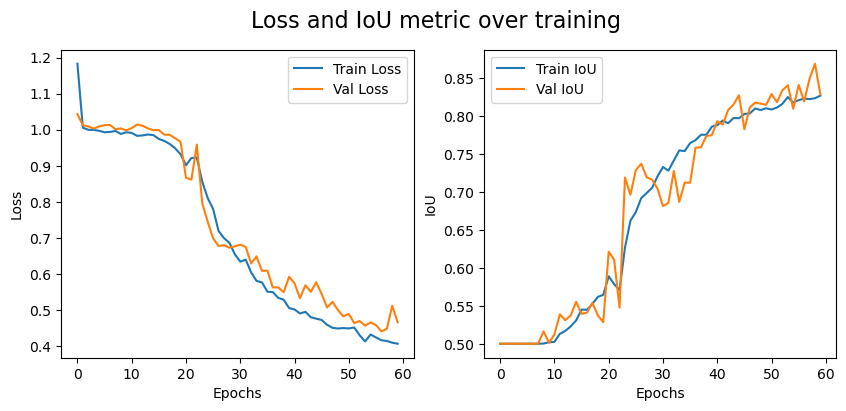

In [ ]:
f,ax = plt.subplots(1,2, figsize=(10, 4))
f.suptitle('Loss and IoU metric over training', fontsize=16)

ax[0].plot(history.history['loss'], label="Train Loss")
ax[0].plot(history.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")


ax[1].plot(history.history['mean_iou'], label="Train IoU")
ax[1].plot(history.history['val_mean_iou'], label="Val IoU")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("IoU")

ax[0].legend()
ax[1].legend()
plt.show()

**Inference**
- We can observe that the loss is decreasing and the mean IoU metric is improving
- But we need to be sure whether it is segmenting based on the tumor information or not

In [ ]:
model1 = keras.models.load_model("Models/simple_autoencoder.h5",compile=False)

### Visualizing Predictions From Validation Data

1/1 [==============================] - 0s 68ms/step


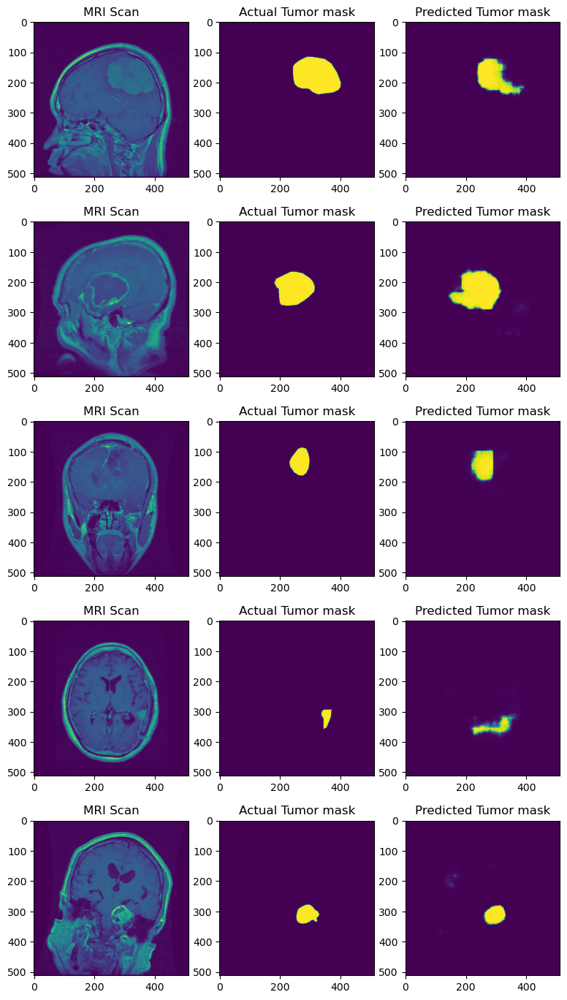

In [ ]:
f,ax = plt.subplots(5,3, figsize=(12,12))

for i in range(5):
    batch = random.randint(0,38)
    img = random.randint(0,15)

    ax[i][0].imshow(val_img[batch][img])
    ax[i][0].set_title("MRI Scan")

    ax[i][1].imshow(val_mask[batch][img])
    ax[i][1].set_title("Actual Tumor mask")

    ax[i][2].imshow(model1.predict(val_img[batch][img].reshape(1,512,512,1)).reshape(512,512))
    ax[i][2].set_title("Predicted Tumor mask")

    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.7,
                    top=1.2)

### Visualizing Predictions From Test Data

1/1 [==============================] - 0s 71ms/step


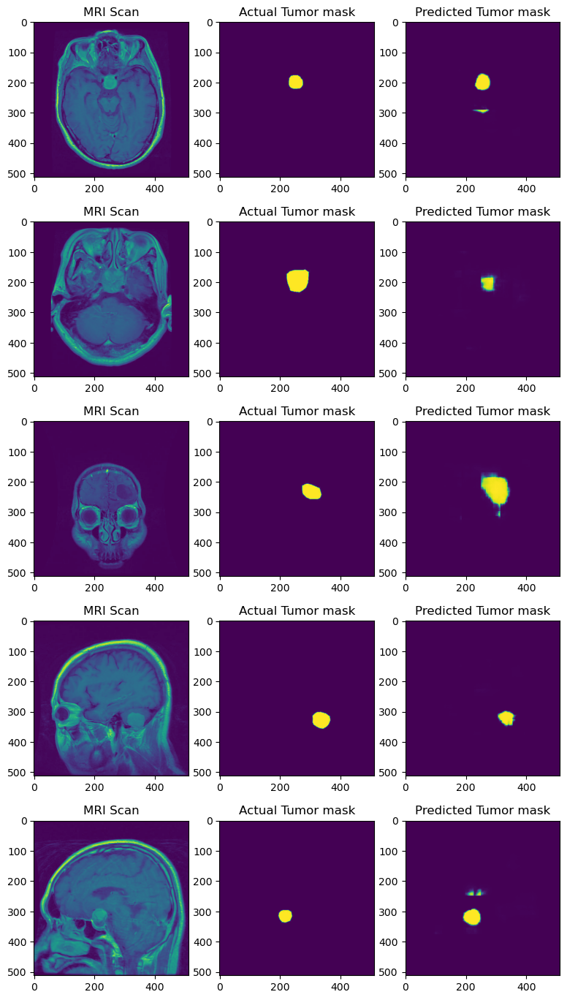

In [ ]:
f,ax = plt.subplots(5,3, figsize=(12,12))

for i in range(5):
    batch = random.randint(0,38)
    img = random.randint(0,15)

    ax[i][0].imshow(test_img[batch][img])
    ax[i][0].set_title("MRI Scan")

    ax[i][1].imshow(test_mask[batch][img])
    ax[i][1].set_title("Actual Tumor mask")

    ax[i][2].imshow(model1.predict(test_img[batch][img].reshape(1,512,512,1)).reshape(512,512))
    ax[i][2].set_title("Predicted Tumor mask")


    plt.subplots_adjust(left=0.1,
                        bottom=0.1,
                        right=0.7,
                        top=1.2)

**Inference**
- We can observe that the model is segmenting the image

**Saliency Maps**
- We are doing saliency maps to see whether the autoencoder is extracting data from the tumor region or not

In [ ]:
def score_function_grad(output):
    return mean_iou(output, y)

def score_function(output):
    return output

1/1 [==============================] - 0s 69ms/step


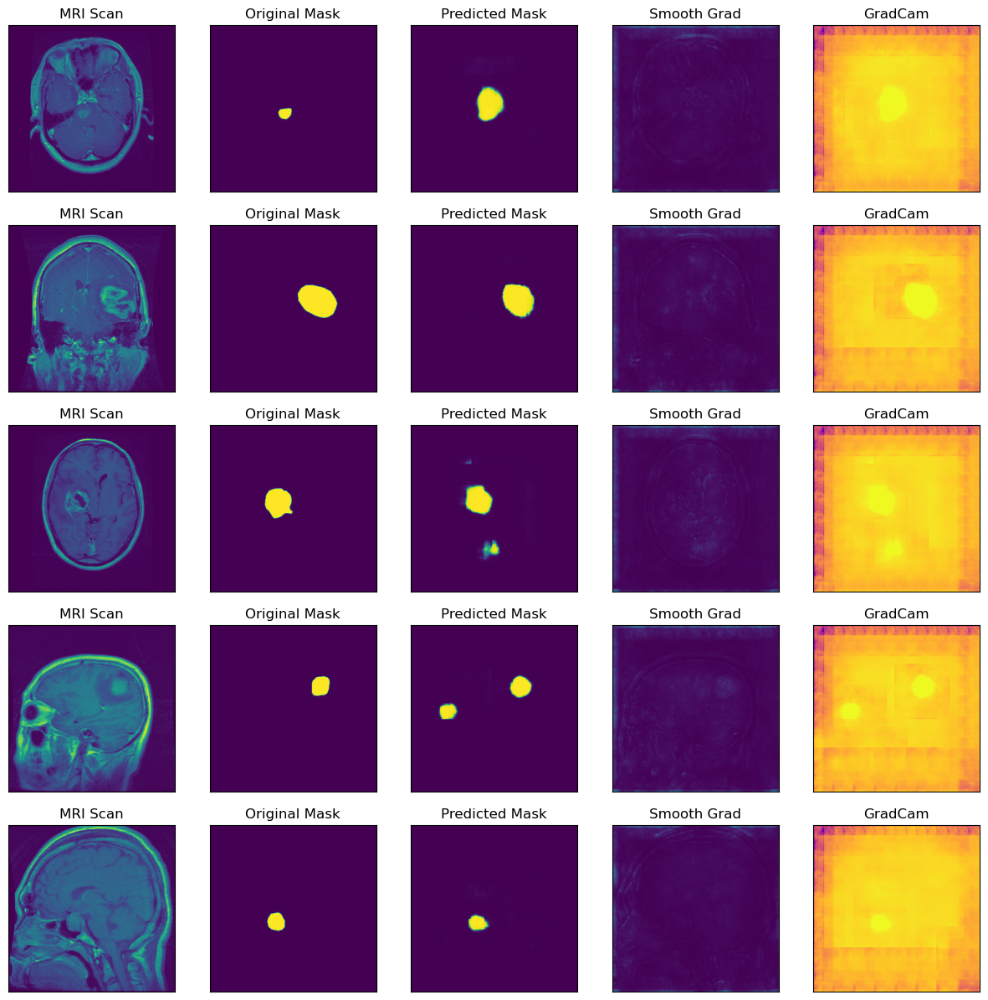

In [ ]:
f,ax = plt.subplots(5,5, figsize=(15,15))

for i in ax.ravel():
    i.set_xticks([])
    i.set_yticks([])

for j in range(5):
    batch = random.randint(0,40)
    img = random.randint(0,15)


    x = np.expand_dims(test_img[batch][img],axis=0)
    y = np.expand_dims(test_mask[batch][img],axis=0)

    # saliency map
    saliency = Saliency(model=model1,
                        model_modifier=ReplaceToLinear())
    saliency_map = saliency(score_function,
                            x,
                            smooth_noise=0.2,
                            smooth_samples = 20)



    # gradcam
    gradcam = Gradcam(model=model1,
                      model_modifier=ReplaceToLinear())

    cam = gradcam(score_function_grad
                  ,x,
                  penultimate_layer=-1)




    ax[j][0].imshow(x.squeeze())
    ax[j][0].set_title("MRI Scan")

    ax[j][1].imshow(y.squeeze())
    ax[j][1].set_title("Original Mask")

    ax[j][2].imshow(model1.predict(x).squeeze())
    ax[j][2].set_title("Predicted Mask")

    ax[j][3].imshow(saliency_map.squeeze(),cmap='viridis')
    ax[j][3].set_title("Smooth Grad")

    # Here, 1-cam is used cause the score function is mean_iou which is like accuracy not loss
    ax[j][4].imshow(1-cam.squeeze(),cmap='plasma')
    ax[j][4].set_title("GradCam")


plt.show()

**Inference**
- Even though, the we got good mean IOU metric the saliency maps shows that the model is taking the information from the whole brain
- So, it might be segmenting based on the shape of the brain or something like that
- We need a better way to segment based on the region of interest

## 2. Segmentation: Simple Version of UNET
- After some research we found UNET architecture is used for the bio-medical image segmentation.

**What is UNET?**
- It is basically a autoencoder in which in the encoder part we will reduce the size of the image but increase the depth to know "WHAT" is in the image
- In the decoder we will decrease the depth and increase the size of the image
- But the difference is that it will find the "WHERE" or precise location of the region of interest using the skip connections in the decoder layer i.e., concatenating output of transpose convolution with feature maps from the encoder of same
- This skip connections preserve the "WHERE" information which helps in selecting the tumor region as out region of interest

**This link helped for simple u-net:** https://blog.paperspace.com/unet-architecture-image-segmentation/

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')


test_datagen = ImageDataGenerator(rescale = 1/255.0)
batch =16
seed = 909

#img
train_img = train_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/train/img",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = seed,
                                              shuffle=False)

val_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/val/img/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = seed,
                                              shuffle=False)

test_img = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/test/img/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = seed,
                                              shuffle=False,)

# mask
train_mask = train_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/train/mask/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = seed,
                                              batch_size=batch,
                                              shuffle=False)

val_mask = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/val/mask/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = seed,
                                              batch_size=batch,
                                              shuffle=False)

test_mask = test_datagen.flow_from_directory(directory="Brain_Tumor_Data/segmentation/test/mask/",
                                              target_size=(512,512),
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = seed,
                                              batch_size=batch,
                                              shuffle=False)

Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.


In [ ]:
# model-2 inspired by u-net

def convolution(inputs, filters = 32):
    conv1 = Conv2D(filters, kernel_size=(3,3), padding="same", strides=(1,1))(inputs)
    batch_norm1 = BatchNormalization()(conv1)
    relu1 = ReLU()(conv1)

    conv2 = Conv2D(filters, kernel_size=(3,3), padding="same", strides=(1,1))(relu1)
    batch_norm2 = BatchNormalization()(conv2)
    relu2 = ReLU()(conv2)

    return relu2

def encoder(inputs, filters = 32):
    cv = convolution(inputs, filters)
    maxpool = MaxPooling2D(pool_size=(4,4))(cv)
    return (cv,maxpool)

def decoder(inputs, skips , filters = 32):
    cv1 = Conv2DTranspose(filters, kernel_size=(3,3), padding="same", strides=(4,4))(inputs)
    concate = Concatenate()([cv1, skips])
    cv2 = convolution(concate, filters)
    return cv2

def U_Net(image_size):
    input1 = Input(image_size)

    # Construct the encoder blocks
    skip1, encoder_1 = encoder(input1, 16)
    skip2, encoder_2 = encoder(encoder_1, 16*2)
    skip3, encoder_3 = encoder(encoder_2, 16*4)
    skip4, encoder_4 = encoder(encoder_3, 16*8)

    # Preparing the next block
    conv_block = convolution(encoder_4, 16*16)

    # Construct the decoder blocks
    decoder_1 = decoder(conv_block, skip4, 16*8)
    decoder_2 = decoder(decoder_1, skip3, 16*4)
    decoder_3 = decoder(decoder_2, skip2, 16*2)
    decoder_4 = decoder(decoder_3, skip1, 16)

    out = Conv2D(1, 1, padding="same", activation="sigmoid")(decoder_4)

    model = Model(input1, out)
    return model

model = U_Net((512,512,1))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 16)         160       ['input_1[0][0]']             
                                                                                                  
 re_lu (ReLU)                (None, 512, 512, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 512, 512, 16)         2320      ['re_lu[0][0]']               
                                                                                              

- This is a simple UNET with less number of parameters i.e., 2,158,417

In [ ]:
opt = Adam(learning_rate=1e-3)
model.compile(optimizer = opt, loss=focal_dice_crosse, metrics = [mean_iou, 'accuracy'])

In [ ]:
es_callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="auto",
    restore_best_weights=True,
)


# Reduce learning rate when a metric has stopped improving.
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, verbose = 1)

In [ ]:
hist = model.fit(zip(train_img,train_mask),
                    epochs=100,
                    steps_per_epoch = len(train_img),
                    validation_data= zip(val_img, val_mask),
                    validation_steps=len(val_img),
                    batch_size=16,
                    workers=-1,
                    use_multiprocessing=True,
                    callbacks=[es_callback,reduce_lr])

Epoch 1/100
115/115 [==============================] - 1186s 10s/step - loss: 1.0830 - mean_iou: 0.5007 - accuracy: 0.9726 - val_loss: 0.9773 - val_mean_iou: 0.5000 - val_accuracy: 0.9808 - lr: 0.0010
Epoch 2/100
115/115 [==============================] - 101s 882ms/step - loss: 0.9530 - mean_iou: 0.5000 - accuracy: 0.9800 - val_loss: 0.9518 - val_mean_iou: 0.5000 - val_accuracy: 0.9808 - lr: 0.0010
Epoch 3/100
115/115 [==============================] - 105s 916ms/step - loss: 0.9097 - mean_iou: 0.5972 - accuracy: 0.9749 - val_loss: 0.8544 - val_mean_iou: 0.6325 - val_accuracy: 0.9790 - lr: 0.0010
Epoch 4/100
115/115 [==============================] - 100s 871ms/step - loss: 0.8916 - mean_iou: 0.6107 - accuracy: 0.9755 - val_loss: 0.8773 - val_mean_iou: 0.5986 - val_accuracy: 0.9810 - lr: 0.0010
Epoch 5/100
115/115 [==============================] - 101s 879ms/step - loss: 0.8762 - mean_iou: 0.6113 - accuracy: 0.9762 - val_loss: 0.9098 - val_mean_iou: 0.6397 - val_accuracy: 0.9778 - lr

In [ ]:
 model.save("/content/drive/MyDrive/Brain_Tumor_Models/simple_unet.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model.save("/content/drive/MyDrive/Brain_Tumor_Models/simple_unet.keras")

**Plots for mean IoU metrics and Loss**
- As mentioned before the mean IoU is used because of the imbalance in pixel level of the data (i.e., tumor region and non-tumor region)

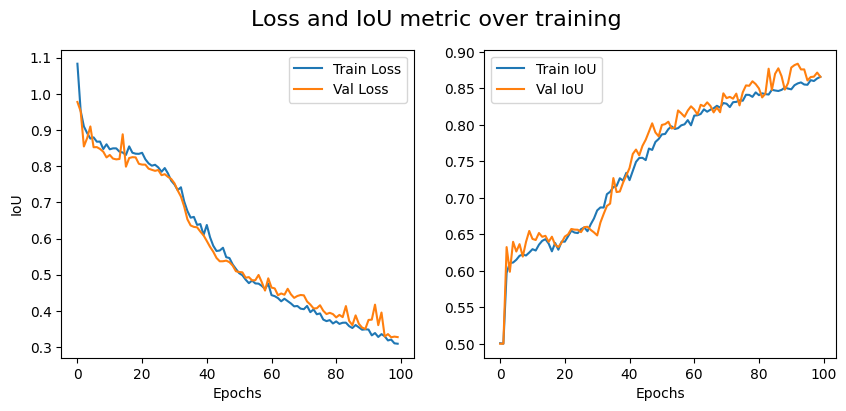

In [ ]:
f,ax = plt.subplots(1,2, figsize=(10, 4))
f.suptitle('Loss and IoU metric over training', fontsize=16)

ax[0].plot(hist.history['loss'], label="Train Loss")
ax[0].plot(hist.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")


ax[1].plot(hist.history['mean_iou'], label="Train IoU")
ax[1].plot(hist.history['val_mean_iou'], label="Val IoU")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("IoU")

ax[0].legend()
ax[1].legend()
plt.show()

In [ ]:
import numpy as np
np.save('/content/drive/MyDrive/Brain_Tumor_Models/my_history.npy',hist.history)

In [ ]:
history=np.load('my_history.npy',allow_pickle='TRUE').item()

In [ ]:
model = keras.models.load_model("Models/simple_unet.h5",compile = False)

In [ ]:
opt = Adam(learning_rate=1e-5)
model.compile(optimizer = opt, loss=focal_dice_crosse, metrics = [mean_iou, 'accuracy'])

es_callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=7,
    mode="auto",
    restore_best_weights=True,
)


# Reduce learning rate when a metric has stopped improving.
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, verbose = 1)

hist = model.fit(zip(train_img,train_mask),
                    epochs=20,
                    steps_per_epoch = len(train_img),
                    validation_data= zip(val_img, val_mask),
                    validation_steps=len(val_img),
                    batch_size=16,
                    workers=-1,
                    use_multiprocessing=True,
                    callbacks=[es_callback,reduce_lr])

Epoch 1/20
115/115 [==============================] - 551s 5s/step - loss: 0.3683 - mean_iou: 0.8507 - accuracy: 0.9815 - val_loss: 0.3758 - val_mean_iou: 0.8374 - val_accuracy: 0.9873 - lr: 1.0000e-05
Epoch 2/20
115/115 [==============================] - 577s 5s/step - loss: 0.3544 - mean_iou: 0.8508 - accuracy: 0.9822 - val_loss: 0.3672 - val_mean_iou: 0.8364 - val_accuracy: 0.9876 - lr: 1.0000e-05
Epoch 3/20
115/115 [==============================] - 627s 5s/step - loss: 0.3420 - mean_iou: 0.8555 - accuracy: 0.9826 - val_loss: 0.3604 - val_mean_iou: 0.8397 - val_accuracy: 0.9877 - lr: 1.0000e-05
Epoch 4/20
115/115 [==============================] - 675s 6s/step - loss: 0.3370 - mean_iou: 0.8573 - accuracy: 0.9825 - val_loss: 0.3550 - val_mean_iou: 0.8430 - val_accuracy: 0.9878 - lr: 1.0000e-05
Epoch 5/20
115/115 [==============================] - 558s 5s/step - loss: 0.3261 - mean_iou: 0.8609 - accuracy: 0.9828 - val_loss: 0.3518 - val_mean_iou: 0.8422 - val_accuracy: 0.9879 - lr: 1

**Inference**
- We can observe that the loss is decreasing and mean IoU is increasing which means our model is segmenting properly

Visualizing prediction on Validation data



1/1 [==============================] - 0s 237ms/step


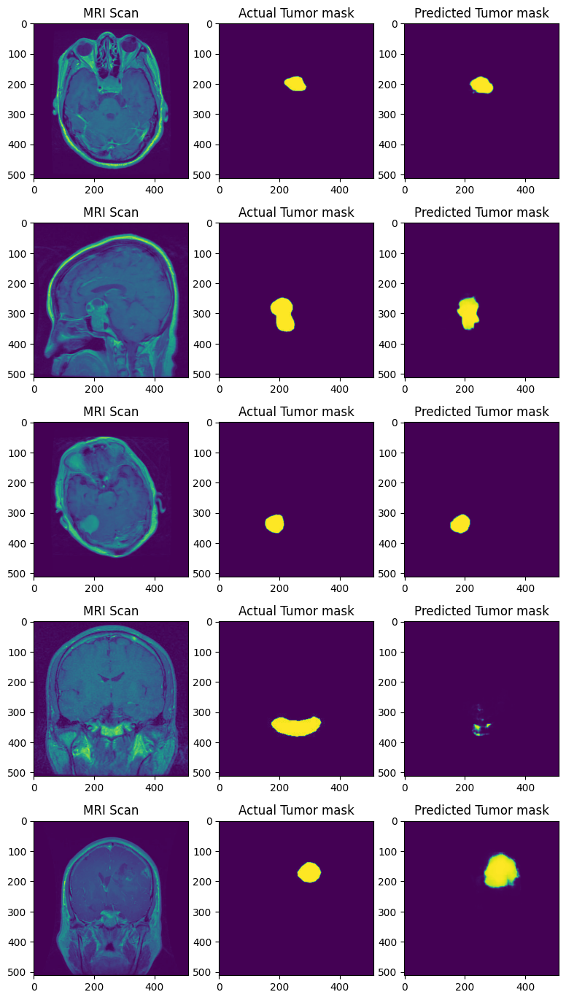

In [ ]:
f,ax = plt.subplots(5,3, figsize=(12,12))

for i in range(5):
  batch = random.randint(0,30)
  img = random.randint(0,15)

  ax[i][0].imshow(val_img[batch][img])
  ax[i][0].set_title("MRI Scan")

  ax[i][1].imshow(val_mask[batch][img])
  ax[i][1].set_title("Actual Tumor mask")

  ax[i][2].imshow(model.predict(val_img[batch][img].reshape(1,512,512,1)).reshape(512,512))
  ax[i][2].set_title("Predicted Tumor mask")

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.7,
                    top=1.2)

plt.show()

Visualizing prediction on Validation data

1/1 [==============================] - 0s 244ms/step


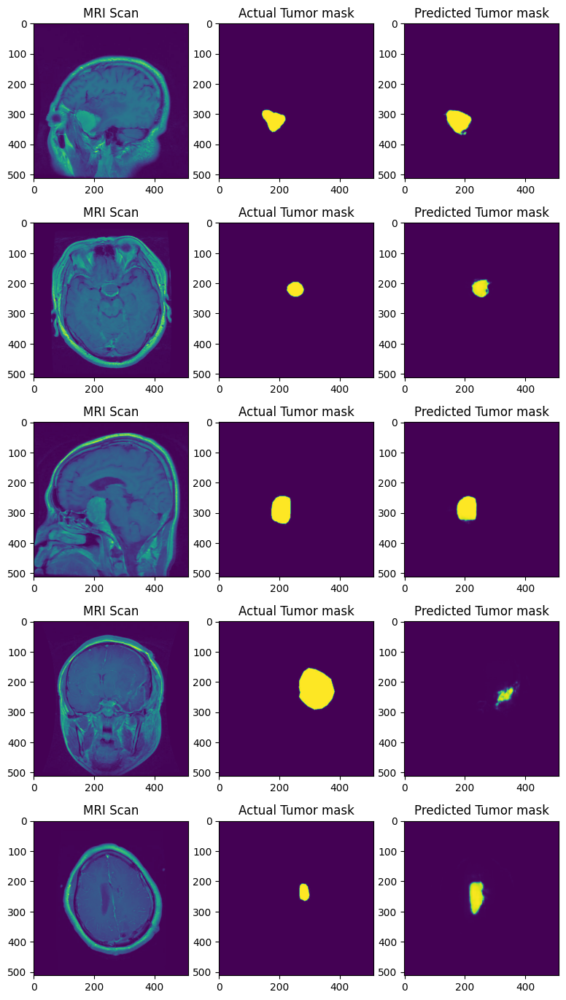

In [ ]:
f,ax = plt.subplots(5,3, figsize=(12,12))

for i in range(5):
  batch = random.randint(0,30)
  img = random.randint(0,15)

  ax[i][0].imshow(test_img[batch][img])
  ax[i][0].set_title("MRI Scan")

  ax[i][1].imshow(test_mask[batch][img])
  ax[i][1].set_title("Actual Tumor mask")

  ax[i][2].imshow(model.predict(test_img[batch][img].reshape(1,512,512,1)).reshape(512,512))
  ax[i][2].set_title("Predicted Tumor mask")

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.7,
                    top=1.2)

plt.show()

**Saliency Maps**
- We are doing the saliency maps to see whether the model is looking at the tumor region or not for the segmentation

1/1 [==============================] - 0s 237ms/step


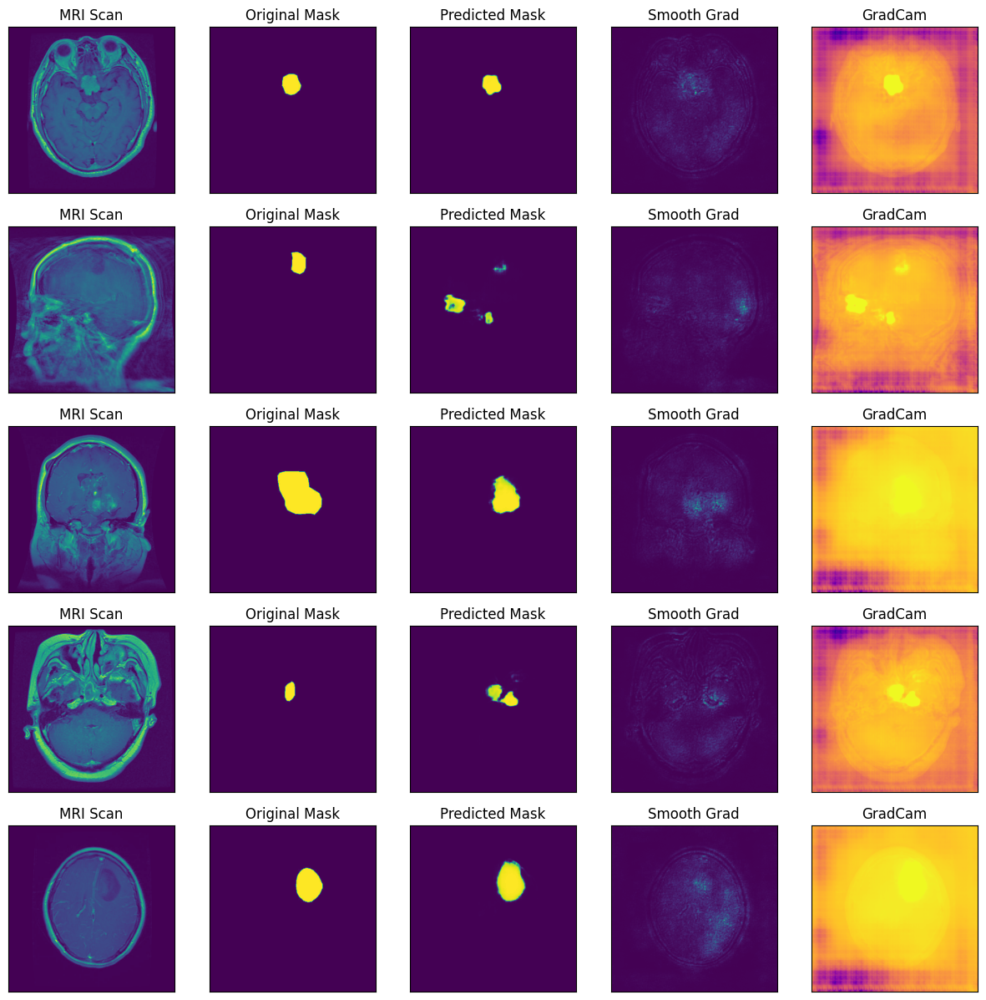

In [ ]:
f,ax = plt.subplots(5,5, figsize=(15,15))

for i in ax.ravel():
    i.set_xticks([])
    i.set_yticks([])

for j in range(5):
    batch = random.randint(0,40)
    img = random.randint(0,15)


    x = np.expand_dims(test_img[batch][img],axis=0)
    y = np.expand_dims(test_mask[batch][img],axis=0)

    # saliency map
    saliency = Saliency(model=model,
                        model_modifier=ReplaceToLinear())
    saliency_map = saliency(score_function,
                            x,
                            smooth_noise=0.2,
                            smooth_samples = 20)



    # gradcam
    gradcam = Gradcam(model=model,
                      model_modifier=ReplaceToLinear())

    cam = gradcam(score_function_grad
                  ,x,
                  penultimate_layer=-1)




    ax[j][0].imshow(x.squeeze())
    ax[j][0].set_title("MRI Scan")

    ax[j][1].imshow(y.squeeze())
    ax[j][1].set_title("Original Mask")

    ax[j][2].imshow(model.predict(x).squeeze())
    ax[j][2].set_title("Predicted Mask")

    ax[j][3].imshow(saliency_map.squeeze(),cmap='viridis')
    ax[j][3].set_title("Smooth Grad")

    # Here, 1-cam is used cause the score function is mean_iou which is like accuracy not loss
    ax[j][4].imshow(1-cam.squeeze(),cmap='plasma')
    ax[j][4].set_title("GradCam")


plt.show()

**Inference**
- From the plots above for gradcam we can see that the model is looking at the tumor region for the segmentation
- So we move forward with classification

**Classification based on latent layer**
**Classification**
- Since, we want to do the classification based on the tumor information we are trying to do the classification using the encoder layers of the UNET till the latent space and build the classification model after that.

- Since, we are segmenting the image to the same space i.e., (512, 512) to (512, 512) we assume that the information about location of the tumor is preserved in the segmentation model and it will help in the classification better

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')


test_datagen = ImageDataGenerator(rescale = 1/255.0)
seed = 909
train_image = train_datagen.flow_from_directory('Brain_Tumor_Data/split_data/Images/train',
                                                   target_size=(512, 512),
                                                   color_mode='grayscale',
                                                   class_mode='categorical',
                                                   batch_size=16,
                                                   seed=seed,
                                                   shuffle=True)

val_image = test_datagen.flow_from_directory('Brain_Tumor_Data/split_data/Images/val',
                                                 target_size=(512, 512),
                                                 color_mode='grayscale',
                                                 class_mode='categorical',
                                                 batch_size=16,
                                                 seed=seed,
                                                 shuffle=True)

test_image = test_datagen.flow_from_directory('Brain_Tumor_Data/split_data/Images/test',
                                                  target_size=(512, 512),
                                                  color_mode='grayscale',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  seed=seed,
                                                  shuffle=True)

Found 2144 images belonging to 3 classes.
Found 612 images belonging to 3 classes.
Found 308 images belonging to 3 classes.


In [ ]:
classification_input = Input(shape=model.layers[0].input_shape[0][1:])
classification_model = classification_input
for layer in model.layers[1:25]:
    layer.trainable = False
    classification_model = layer(classification_model)

In [ ]:
flat = Flatten()(classification_model)
dense1 = Dense(64, activation='gelu')(flat)
dense2 = Dense(128,activation='gelu')(dense1)
dense3 = Dense(256,activation = 'gelu')(dense2)
drop = Dropout(0.4)(dense3)
out= Dense(3, activation='softmax')(drop)

In [ ]:
classification_model = Model(inputs = classification_input, outputs = out)
classification_model.compile(optimizer = 'adam', loss='categorical_crossentropy', metrics =['accuracy',tf.keras.metrics.Recall(),tf.keras.metrics.Precision()])
classification_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 512, 512, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 512, 512, 16)      160       
                                                                 
 re_lu (ReLU)                (None, 512, 512, 16)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 512, 512, 16)      2320      
                                                                 
 re_lu_1 (ReLU)              (None, 512, 512, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 16)     0         
 )                                                               
                                                             

In [ ]:
# # EarlyStopping with patience = 5
early = EarlyStopping(monitor='val_loss',patience=5, verbose=1)


# Reduce learning rate when a metric has stopped improving.
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose = 1)

clf_hist = classification_model.fit(train_image,
                                         epochs=30,
                                         steps_per_epoch =len(train_image),
                                         validation_data= val_image,
                                         validation_steps=len(val_image),
                                         batch_size=16,
                                         workers=-1,
                                         use_multiprocessing=True,
                                         callbacks=[early , reduce_lr])

Epoch 1/30
134/134 [==============================] - 160s 1s/step - loss: 1.0099 - accuracy: 0.5084 - recall: 0.2043 - precision: 0.5935 - val_loss: 0.9688 - val_accuracy: 0.5049 - val_recall: 0.3856 - val_precision: 0.5632 - lr: 0.0010
Epoch 2/30
134/134 [==============================] - 178s 1s/step - loss: 0.9112 - accuracy: 0.5905 - recall: 0.4310 - precision: 0.6600 - val_loss: 0.8531 - val_accuracy: 0.6225 - val_recall: 0.4820 - val_precision: 0.6925 - lr: 0.0010
Epoch 3/30
134/134 [==============================] - 165s 1s/step - loss: 0.8838 - accuracy: 0.6026 - recall: 0.4669 - precision: 0.6612 - val_loss: 0.8721 - val_accuracy: 0.5915 - val_recall: 0.4706 - val_precision: 0.7007 - lr: 0.0010
Epoch 4/30
134/134 [==============================] - 168s 1s/step - loss: 0.8692 - accuracy: 0.6124 - recall: 0.4865 - precision: 0.6862 - val_loss: 0.8682 - val_accuracy: 0.6405 - val_recall: 0.4363 - val_precision: 0.7355 - lr: 0.0010
Epoch 5/30
134/134 [============================

In [ ]:
classification_model.save("Models/simple_unet_clf.keras")
classification_model.save("Models/simple_unet_clf.h5")

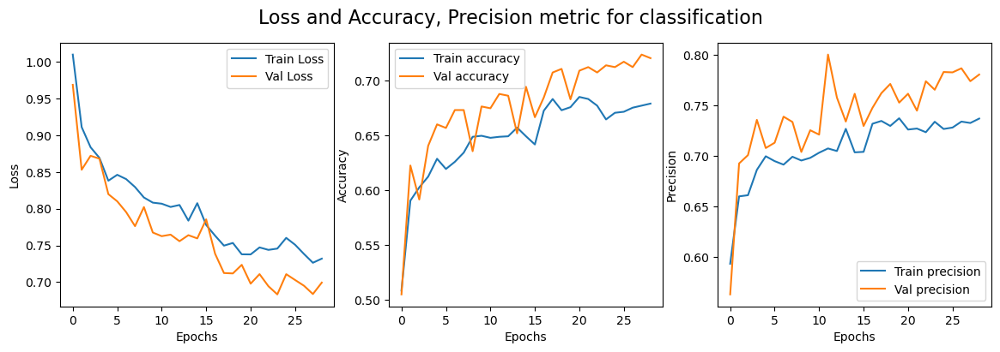

In [ ]:
f,ax = plt.subplots(1,3, figsize=(14, 4))
f.suptitle('Loss and Accuracy, Precision metric for classification', fontsize=16)

ax[0].plot(clf_hist.history['loss'], label="Train Loss")
ax[0].plot(clf_hist.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")

ax[1].plot(clf_hist.history['accuracy'], label="Train accuracy")
ax[1].plot(clf_hist.history['val_accuracy'], label="Val accuracy")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")

ax[2].plot(clf_hist.history['precision'], label="Train precision")
ax[2].plot(clf_hist.history['val_precision'], label="Val precision")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("Precision")


ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.show()

***prediction on val data***

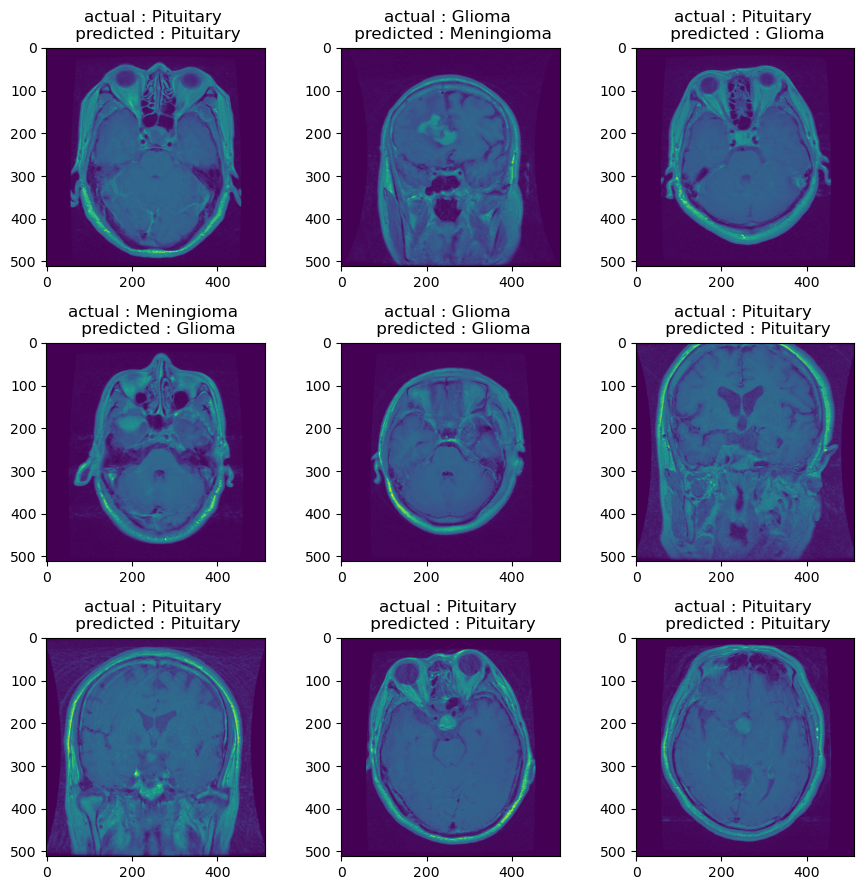

In [ ]:
prediction_test_sample(classification_model,val_image)

***prediction on test data***

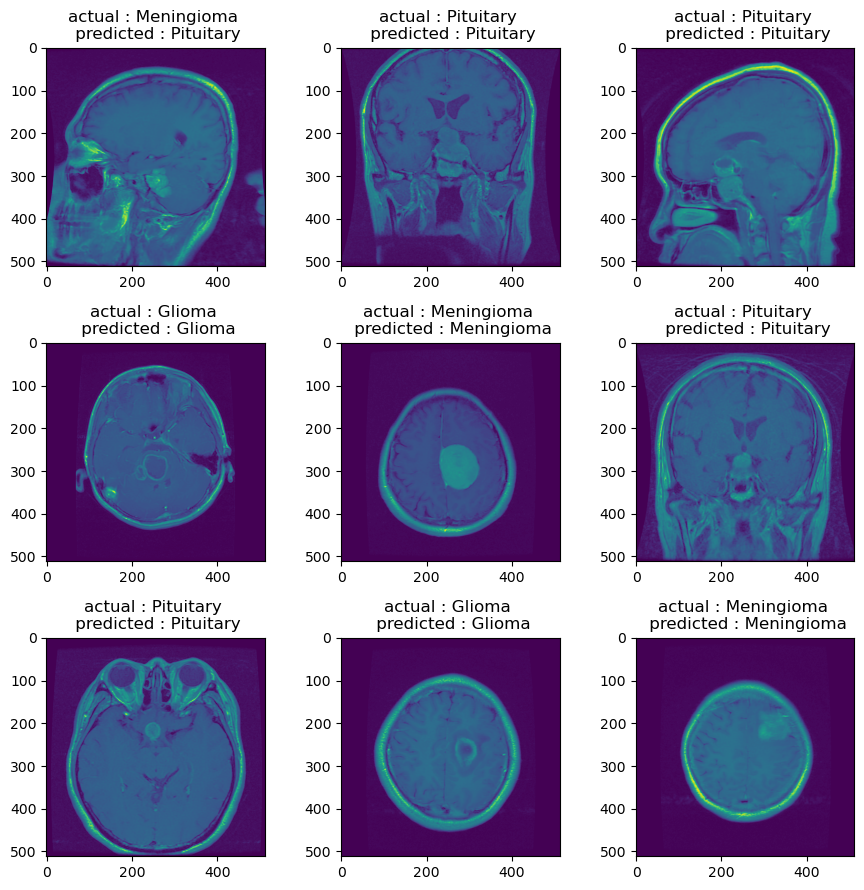

In [ ]:
prediction_test_sample(classification_model,test_image)

In [ ]:
_,accuarcy,_,precision = classification_model.evaluate(test_image)
print("test_accuracy : ",accuarcy)
print("test_precision : ",precision)

20/20 [==============================] - 6s 300ms/step - loss: 0.6113 - accuracy: 0.7630 - recall: 0.6753 - precision: 0.8093
test_accuracy :  0.7629870176315308
test_precision :  0.8093385100364685


**Inference**
- We can observe that the loss is decreasing and the accuracy and precision are increasing
- We getting accuracy of 76 % on test data
- we tried lot of architecture but accuracy not incease more than 80%
- let's try full UNET

## 3. Full UNET Implementation

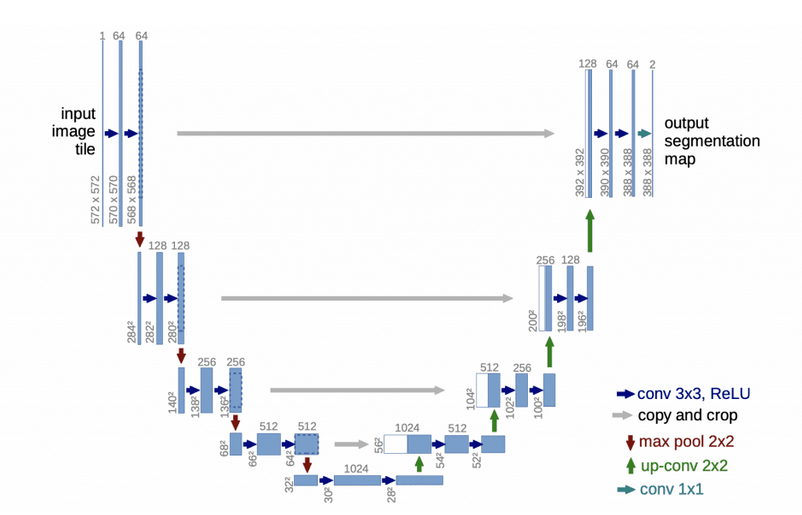

- The UNET architecture shown in this figure is implemented in this part
- This is a big UNET architecture since it contains much more parameters than the UNET we used before.

Modifications
- In between the layers we have used BatchNormalisation for regularization
- We also have used the data augmentation which will be described in the cell below

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1/255.0)
batch =16
#img
train_img = train_datagen.flow_from_directory(directory="/content/drive/MyDrive/segmentation/train/img/",
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False)

val_img = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/segmentation/val/img/",
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False)

test_img = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/segmentation/test/img/",
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False,)

# mask
train_mask = train_datagen.flow_from_directory(directory="/content/drive/MyDrive/segmentation/train/mask/",
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

val_mask = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/segmentation/val/mask/",
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

test_mask = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/segmentation/test/mask/",
                                              class_mode=None,
                                              color_mode = "grayscale",
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization

# Define a function to create a convolutional block with batch normalization
def conv_block(x, filters, kernel_size=(3, 3), activation='relu', padding='same'):
    x = Conv2D(filters, kernel_size, activation=activation, padding=padding)(x)
    x = BatchNormalization()(x)
    x = Conv2D(filters, kernel_size, activation=activation, padding=padding)(x)
    x = BatchNormalization()(x)
    return x

# Define the U-Net architecture with batch normalization
def unet_with_batchnorm(input_size=(256, 256, 1)):
    # Input layer
    inputs = Input(input_size)

    # Encoder
    conv1 = conv_block(inputs, 64)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = conv_block(pool3, 512)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottom of the U-Net
    conv5 = conv_block(pool4, 1024)

    # Decoder
    up6 = UpSampling2D(size=(2, 2))(conv5)
    concat6 = concatenate([conv4, up6], axis=3)
    conv6 = conv_block(concat6, 512)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    concat7 = concatenate([conv3, up7], axis=3)
    conv7 = conv_block(concat7, 256)

    up8 = UpSampling2D(size=(2, 2))(conv7)
    concat8 = concatenate([conv2, up8], axis=3)
    conv8 = conv_block(concat8, 128)

    up9 = UpSampling2D(size=(2, 2))(conv8)
    concat9 = concatenate([conv1, up9], axis=3)
    conv9 = conv_block(concat9, 64)

    # Output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    # Create the model
    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create a U-Net model with batch normalization
model = unet_with_batchnorm(input_size=(256, 256, 1))

# Summary of the model architecture
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         640       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['batch_normalization[0][0

In [ ]:
# compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
              loss=focal_dice_crosse,
              metrics=['accuracy',mean_iou])

In [ ]:
checkpoint  = ModelCheckpoint('/content/drive/MyDrive/best_unet_model.h5',
                              save_best_only=True,
                              monitor='val_loss',
                              mode='min',
                              verbose=1)

early_stop = EarlyStopping(monitor='val_loss',
                           patience=10,
                           mode='min',
                           restore_best_weights=True)

lr = ReduceLROnPlateau(patience=4,
                       verbose=2,
                       monitor='val_loss',
                       min_lr=1e-4,
                       mode='min',
                       restore_best_weights=True)


history = model.fit(zip(train_img,train_mask),
                        epochs=70,
                        steps_per_epoch = len(train_img),
                        validation_data= zip(val_img, val_mask),
                        validation_steps=len(val_img),
                        validation_batch_size=16,
                        workers=-1,
                        use_multiprocessing=True,
                        callbacks= [checkpoint, early_stop, lr])

Epoch 1/70
115/115 [==============================] - ETA: 0s - loss: 1.4765 - accuracy: 0.8973 - mean_iou: 0.6914
Epoch 1: val_loss improved from inf to 3.29047, saving model to /content/drive/MyDrive/best_unet_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


115/115 [==============================] - 1346s 11s/step - loss: 1.4765 - accuracy: 0.8973 - mean_iou: 0.6914 - val_loss: 3.2905 - val_accuracy: 0.9807 - val_mean_iou: 0.5000 - lr: 0.0010
Epoch 2/70
115/115 [==============================] - ETA: 0s - loss: 1.0755 - accuracy: 0.9741 - mean_iou: 0.6832
Epoch 2: val_loss did not improve from 3.29047
115/115 [==============================] - 147s 1s/step - loss: 1.0755 - accuracy: 0.9741 - mean_iou: 0.6832 - val_loss: 5.7952 - val_accuracy: 0.3105 - val_mean_iou: 0.6506 - lr: 0.0010
Epoch 3/70
115/115 [==============================] - ETA: 0s - loss: 0.8683 - accuracy: 0.9749 - mean_iou: 0.7122
Epoch 3: val_loss did not improve from 3.29047
115/115 [==============================] - 150s 1s/step - loss: 0.8683 - accuracy: 0.9749 - mean_iou: 0.7122 - val_loss: 37.2099 - val_accuracy: 0.1472 - val_mean_iou: 0.5622 - lr: 0.0010
Epoch 4/70
115/115 [==============================] - ETA: 0s - loss: 0.7626 - accuracy: 0.9762 - mean_iou: 0.69

In [ ]:
history = model.fit(zip(train_img,train_mask),
                        epochs=100,
                        initial_epoch = 70,
                        steps_per_epoch = len(train_img),
                        validation_data= zip(val_img, val_mask),
                        validation_steps=len(val_img),
                        validation_batch_size=16,
                        workers=-1,
                        use_multiprocessing=True,
                        callbacks= [checkpoint, early_stop, lr])

Epoch 71/100
115/115 [==============================] - ETA: 0s - loss: 0.2194 - accuracy: 0.9850 - mean_iou: 0.9043
Epoch 71: val_loss did not improve from 0.35555
115/115 [==============================] - 148s 1s/step - loss: 0.2194 - accuracy: 0.9850 - mean_iou: 0.9043 - val_loss: 0.3755 - val_accuracy: 0.9885 - val_mean_iou: 0.8215 - lr: 1.0000e-04
Epoch 72/100
115/115 [==============================] - ETA: 0s - loss: 0.2211 - accuracy: 0.9848 - mean_iou: 0.9037
Epoch 72: val_loss did not improve from 0.35555
115/115 [==============================] - 139s 1s/step - loss: 0.2211 - accuracy: 0.9848 - mean_iou: 0.9037 - val_loss: 0.4062 - val_accuracy: 0.9876 - val_mean_iou: 0.8154 - lr: 1.0000e-04
Epoch 73/100
115/115 [==============================] - ETA: 0s - loss: 0.2133 - accuracy: 0.9850 - mean_iou: 0.9066
Epoch 73: val_loss did not improve from 0.35555
115/115 [==============================] - 149s 1s/step - loss: 0.2133 - accuracy: 0.9850 - mean_iou: 0.9066 - val_loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


115/115 [==============================] - 159s 1s/step - loss: 0.2095 - accuracy: 0.9849 - mean_iou: 0.9098 - val_loss: 0.3526 - val_accuracy: 0.9889 - val_mean_iou: 0.8300 - lr: 1.0000e-04
Epoch 76/100
115/115 [==============================] - ETA: 0s - loss: 0.2066 - accuracy: 0.9849 - mean_iou: 0.9102
Epoch 76: val_loss did not improve from 0.35260
115/115 [==============================] - 149s 1s/step - loss: 0.2066 - accuracy: 0.9849 - mean_iou: 0.9102 - val_loss: 0.3591 - val_accuracy: 0.9887 - val_mean_iou: 0.8298 - lr: 1.0000e-04
Epoch 77/100
115/115 [==============================] - ETA: 0s - loss: 0.2069 - accuracy: 0.9850 - mean_iou: 0.9113
Epoch 77: val_loss improved from 0.35260 to 0.34630, saving model to /content/drive/MyDrive/best_unet_model.h5
115/115 [==============================] - 157s 1s/step - loss: 0.2069 - accuracy: 0.9850 - mean_iou: 0.9113 - val_loss: 0.3463 - val_accuracy: 0.9892 - val_mean_iou: 0.8269 - lr: 1.0000e-04
Epoch 78/100
115/115 [============

**Plots for the loss, accuracy and Mean IoU**

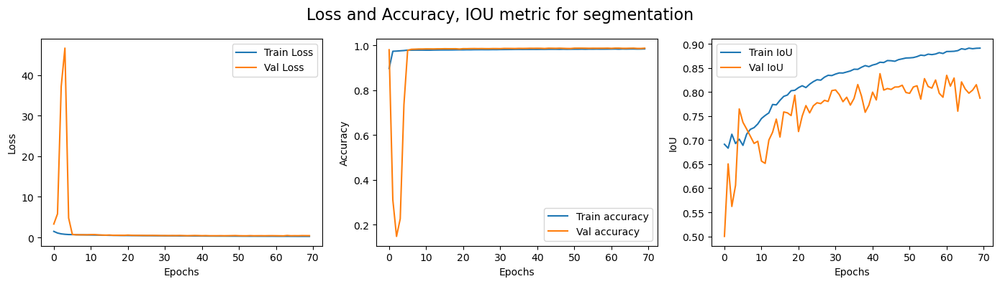

In [ ]:
f,ax = plt.subplots(1,3, figsize=(14, 4))
f.suptitle('Loss and Accuracy, IOU metric for segmentation', fontsize=16)

ax[0].plot(history.history['loss'], label="Train Loss")
ax[0].plot(history.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")

ax[1].plot(history.history['accuracy'], label="Train accuracy")
ax[1].plot(history.history['val_accuracy'], label="Val accuracy")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")

ax[2].plot(history.history['mean_iou'], label="Train IoU")
ax[2].plot(history.history['val_mean_iou'], label="Val IoU")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("IoU")

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

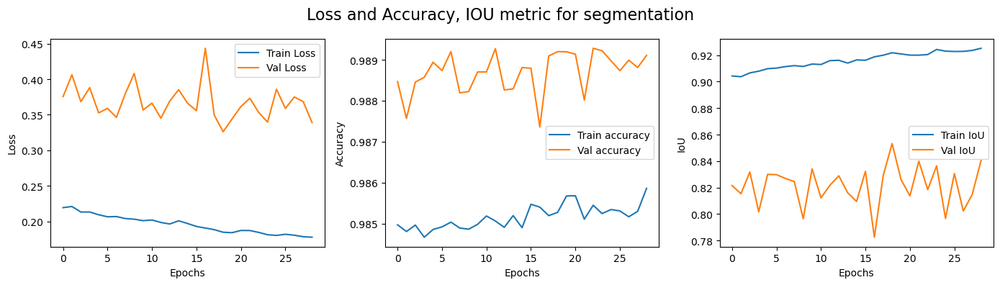

In [ ]:
f,ax = plt.subplots(1,3, figsize=(14, 4))
f.suptitle('Loss and Accuracy, IOU metric for segmentation', fontsize=16)

ax[0].plot(history.history['loss'], label="Train Loss")
ax[0].plot(history.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")

ax[1].plot(history.history['accuracy'], label="Train accuracy")
ax[1].plot(history.history['val_accuracy'], label="Val accuracy")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")

ax[2].plot(history.history['mean_iou'], label="Train IoU")
ax[2].plot(history.history['val_mean_iou'], label="Val IoU")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("IoU")

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

**Inference**
- We can observe that our mean iou for the model is around 0.85 by minimising the loss function which is the combination of three loss functions as mentioned above
- But we should Check the saliency maps to see whether the model is taking the information of tumor into consideration to segment the image.

In [ ]:
model = keras.models.load_model("/content/drive/MyDrive/FULL_UNET_ver2.h5",compile=False)

**Saliency Maps**
- We are doing the saliency maps to see the model is taking the information of the tumor or not

1/1 [==============================] - 1s 758ms/step


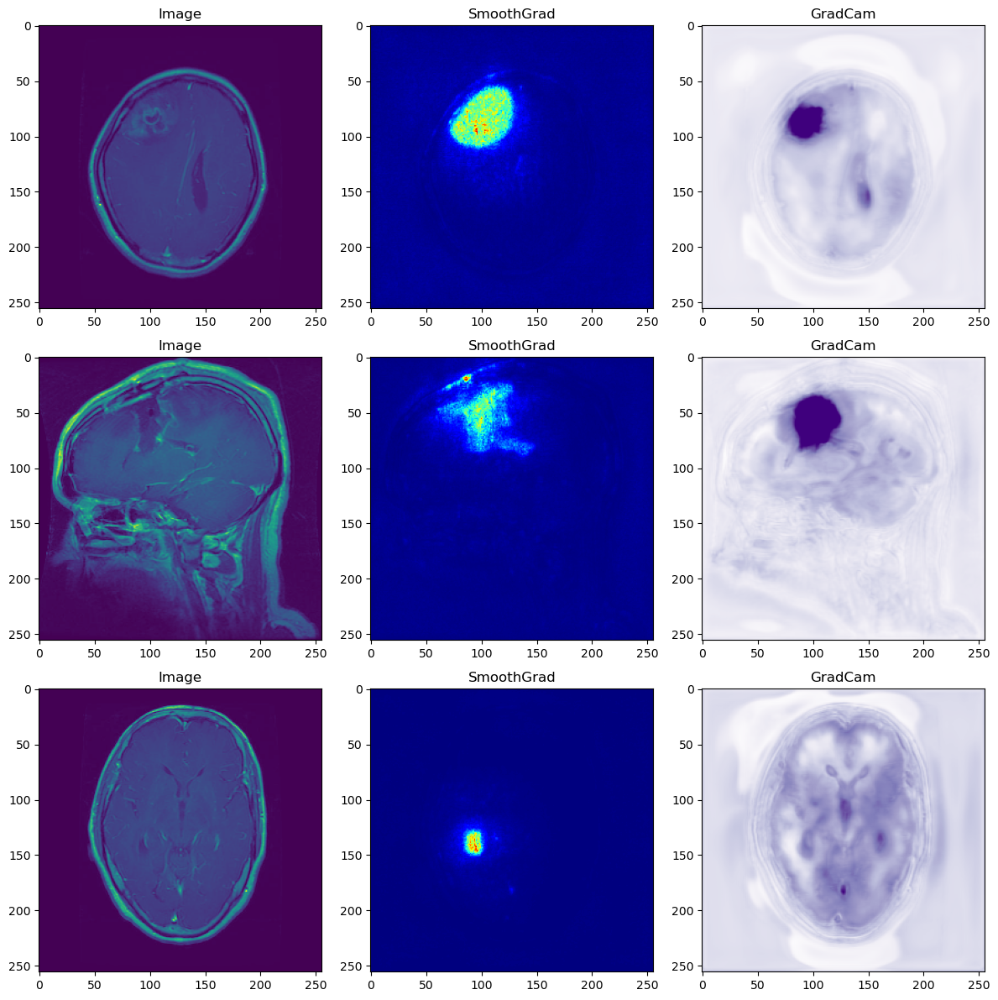

In [ ]:
f, ax = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))
image_titles = ["Image", "SmoothGrad", "GradCam"]
plt.tight_layout()

for i in range(3):
    batch = random.randint(0,30)
    ix = random.randint(0,15)

    def score_fun(out = model.predict(val_img[batch][ix].reshape(1,256,256,1)),label = val_mask[batch][ix]):
        return mean_iou(out,label)

    saliency = Saliency(model , model_modifier=ReplaceToLinear() , clone=True)

    saliency_map = saliency(score_fun,val_img[batch][ix].reshape(1,256,256,1),smooth_noise=0.2,smooth_samples = 20)


    gradcam = Gradcam(model,model_modifier=ReplaceToLinear())

    cam = gradcam(score_fun,val_img[batch][ix].reshape(1,256,256,1),penultimate_layer=-1)

    ax[i][0].set_title(image_titles[0], fontsize=12)
    ax[i][0].imshow(val_img[batch][ix].reshape(1,256,256,1).reshape(256,256))
    ax[i][0].axis('on')

    ax[i][1].set_title(image_titles[1], fontsize=12)
    ax[i][1].imshow(saliency_map.squeeze(), cmap='jet')
    ax[i][1].axis('on')

    ax[i][2].set_title(image_titles[2], fontsize=12)
    ax[i][2].imshow(val_img[batch][ix].reshape(1,256,256,1).reshape(256,256))
  # Here, 1-cam is used cause the score function is mean_iou which is like accuracy not loss
    ax[i][2].imshow(1-cam.squeeze(), cmap='Purples')
    ax[i][2].axis('on')
plt.show()

**Inference**
- From this figure of smooth grad and grad cam, we can clearly observe that the model is segmenting based on the tumor information

In [ ]:
mean_iou_list = []
images = []

for batch in range(38):
    for img in range(16):
        y_true = val_img[batch][img]
        y_pred = model.predict(val_img[batch][img].reshape(1,256,256,1))
        iou_score = mean_iou(y_true,y_pred)
        mean_iou_list.append(iou_score.numpy())
        images.append((batch,img))

1/1 [==============================] - 3s 3s/step


In [ ]:
index = np.argsort(mean_iou_list)

1/1 [==============================] - 2s 2s/step


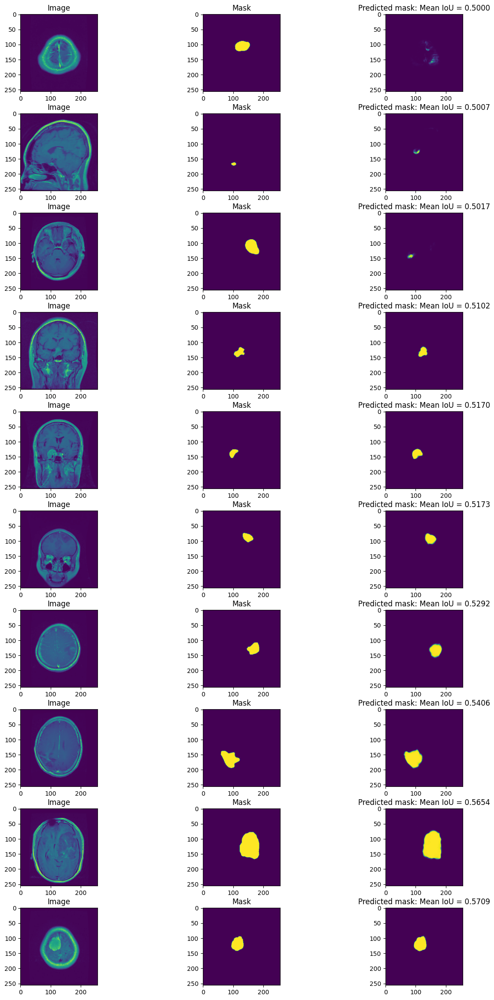

In [ ]:
buckets = [50, 90, 105, 255, 356, 360,480,550,600,607]
figure, ax = plt.subplots(10, 3, figsize = (20, 20))

plt.tight_layout()
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.7,
                    top=1.2)
for i in range(10):
    ax[i][0].imshow(val_img[images[index[buckets[i]]][0]][images[index[buckets[i]]][1]].reshape(256,256))
    ax[i][0].set_title("Image", fontsize = 12)

    ax[i][1].imshow(val_mask[images[index[buckets[i]]][0]][images[index[buckets[i]]][1]].reshape(256,256))
    ax[i][1].set_title("Mask", fontsize = 12)

    ax[i][2].imshow(model.predict(val_img[images[index[buckets[i]]][0]][images[index[buckets[i]]][1]].reshape(1,256,256,1)).reshape(256,256))
    ax[i][2].set_title(f"Predicted mask: Mean IoU = {mean_iou_list[index[buckets[i]]]:.4f}", fontsize = 12)

plt.show()

**Inference**
- From the plot above, we can get a idea about how the images are segmented
- If the mean iou is high then the segmentation is good as the mask given in the data
- If the mean iou is low then the segmentation is bad compared to the mask given

 **Classification**
- Since, we want to do the classification based on the tumor information we are trying to do the classification using the encoder layers of the UNET till the latent space and build the classification model after that.

- Since, we are segmenting the image to the same space i.e., (256, 256) to (256, 256) we assume that the information about location of the tumor is preserved in the segmentation model and it will help in the classification better

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1/255.0)

seed = 909
train_image = train_datagen.flow_from_directory('/content/drive/MyDrive/DATA/split_data/Images/train',
                                                   target_size=(256, 256),
                                                   color_mode='grayscale',
                                                   class_mode='categorical',
                                                   batch_size=16,
                                                   seed=seed,
                                                   shuffle=True)

val_image = test_datagen.flow_from_directory('/content/drive/MyDrive/DATA/split_data/Images/val',
                                                 target_size=(256, 256),
                                                 color_mode='grayscale',
                                                 class_mode='categorical',
                                                 batch_size=16,
                                                 seed=seed,
                                                 shuffle=True)

test_image = test_datagen.flow_from_directory('/content/drive/MyDrive/DATA/split_data/Images/test',
                                                  target_size=(256, 256),
                                                  color_mode='grayscale',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  seed=seed,
                                                  shuffle=True)

Found 2144 images belonging to 3 classes.
Found 612 images belonging to 3 classes.
Found 308 images belonging to 3 classes.


- In building the classification model first we used the encoder layers upto latent space of the UNET model above and applied the same data augmentation to the data as used in the above segmentation model

In [ ]:
# load model
model = keras.models.load_model("/content/drive/MyDrive/best_unet_model.h5",compile=False)

In [ ]:
classification_input = Input(shape = (256,256,1))
classification_model = classification_input

for layer in model.layers[1:25]:
    layer.trainable = False
    classification_model = layer(classification_model)

In [ ]:
flat = Flatten()(classification_model)
final = Dense(3, activation='softmax')(flat)


classification_model = Model(inputs = classification_input, outputs = final)
classification_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      640       
                                                                 
 batch_normalization (Batch  (None, 256, 256, 64)      256       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_1 (Bat  (None, 256, 256, 64)      256       
 chNormalization)                                                
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)      0     

In [ ]:
classification_model.compile(optimizer = Adam(),
                             loss=CategoricalCrossentropy(),
                             metrics =['accuracy',tf.keras.metrics.Recall(),tf.keras.metrics.Precision()])

In [ ]:
checkpoint_clf  = ModelCheckpoint('/content/drive/MyDrive/model_best_unet_clf.h5',
                                    save_best_only=True,
                                    monitor='val_loss',
                                    mode='min',
                                    verbose=1)

early_stop_clf = EarlyStopping(monitor='val_loss',
                                 patience=10,
                                 mode='min',
                                 restore_best_weights=True)

lr_clf = ReduceLROnPlateau(patience=4,
                             verbose=2,
                             monitor='val_loss',
                             min_lr=1e-4,
                             mode='min',
                             restore_best_weights=True)

callback_clf = [early_stop_clf, lr_clf, checkpoint_clf]

clf_hist = classification_model.fit(train_image,
                                    epochs=100,
                                    steps_per_epoch = len(train_image),
                                    validation_data= val_image,
                                    validation_steps=len(val_image),
                                    validation_batch_size=16,
                                    workers=-1,
                                    use_multiprocessing=True,
                                    callbacks = callback_clf)

Epoch 1/100
134/134 [==============================] - ETA: 0s - loss: 31.0316 - accuracy: 0.6544 - recall: 0.6539 - precision: 0.6548
Epoch 1: val_loss improved from inf to 22.80943, saving model to /content/drive/MyDrive/model_best_unet_clf.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


134/134 [==============================] - 591s 4s/step - loss: 31.0316 - accuracy: 0.6544 - recall: 0.6539 - precision: 0.6548 - val_loss: 22.8094 - val_accuracy: 0.7484 - val_recall: 0.7484 - val_precision: 0.7484 - lr: 0.0010
Epoch 2/100
134/134 [==============================] - ETA: 0s - loss: 22.1880 - accuracy: 0.7397 - recall: 0.7397 - precision: 0.7401
Epoch 2: val_loss did not improve from 22.80943
134/134 [==============================] - 52s 388ms/step - loss: 22.1880 - accuracy: 0.7397 - recall: 0.7397 - precision: 0.7401 - val_loss: 25.4865 - val_accuracy: 0.7467 - val_recall: 0.7467 - val_precision: 0.7467 - lr: 0.0010
Epoch 3/100
134/134 [==============================] - ETA: 0s - loss: 19.6676 - accuracy: 0.7743 - recall: 0.7743 - precision: 0.7743
Epoch 3: val_loss improved from 22.80943 to 9.24497, saving model to /content/drive/MyDrive/model_best_unet_clf.h5
134/134 [==============================] - 52s 385ms/step - loss: 19.6676 - accuracy: 0.7743 - recall: 0.77

**The plots of accuracy, precision and loss**

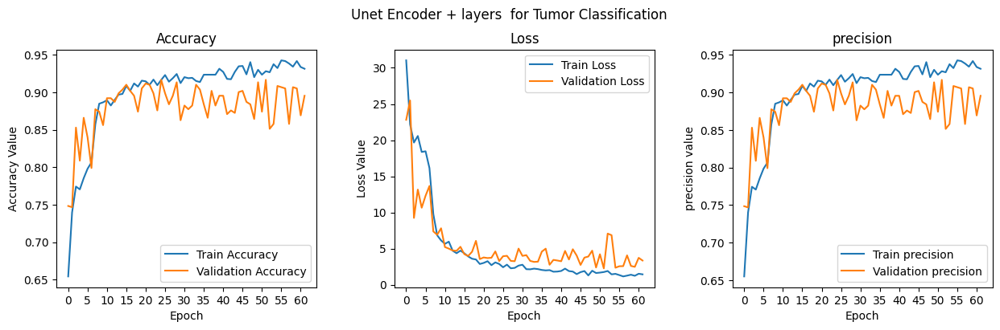

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
t = f.suptitle('Unet Encoder + layers  for Tumor Classification', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)
epoch_list = clf_hist.epoch

ax1.plot(epoch_list, clf_hist.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, clf_hist.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epoch_list[-1], 5))
ax1.set_ylabel('Accuracy Value');ax1.set_xlabel('Epoch');ax1.set_title('Accuracy')
ax1.legend(loc="best");

ax2.plot(epoch_list, clf_hist.history['loss'], label='Train Loss')
ax2.plot(epoch_list, clf_hist.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epoch_list[-1], 5))
ax2.set_ylabel('Loss Value');ax2.set_xlabel('Epoch');ax2.set_title('Loss')
ax2.legend(loc="best");

ax3.plot(epoch_list, clf_hist.history['precision'], label='Train precision')
ax3.plot(epoch_list, clf_hist.history['val_precision'], label='Validation precision')
ax3.set_xticks(np.arange(0, epoch_list[-1], 5))
ax3.set_ylabel('precision value');ax3.set_xlabel('Epoch');ax3.set_title('precision')
ax3.legend(loc="best");

**Inference**
- We can observe that the loss is decreasing and the precision and accuracy is increasing

In [ ]:
classification_model.save('/content/drive/MyDrive/clf_unet_model.h5')
np.save('/content/drive/MyDrive/CLG_UNET_HIST.npy',clf_hist.history)

In [ ]:
classification_model.evaluate(test_image)

39/39 [==============================] - 10s 242ms/step - loss: 2.2657 - accuracy: 0.9167 - recall: 0.9167 - precision: 0.9167


[2.2656593322753906,
 0.9166666865348816,
 0.9166666865348816,
 0.9166666865348816]

- We got an accuracy of 91.66 % from this model

In [ ]:
model = keras.models.load_model("Models/model_best_unet_clf.h5",compile=False)

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1/255.0)

seed = 909
train_image = train_datagen.flow_from_directory('Brain_Tumor_Data/split_data/Images/train',
                                                   target_size=(256, 256),
                                                   color_mode='grayscale',
                                                   class_mode='categorical',
                                                   batch_size=16,
                                                   seed=seed,
                                                   shuffle=True)

val_image = test_datagen.flow_from_directory('Brain_Tumor_Data/split_data/Images/val',
                                                 target_size=(256, 256),
                                                 color_mode='grayscale',
                                                 class_mode='categorical',
                                                 batch_size=16,
                                                 seed=seed,
                                                 shuffle=True)

test_image = test_datagen.flow_from_directory('Brain_Tumor_Data/split_data/Images/test',
                                                  target_size=(256, 256),
                                                  color_mode='grayscale',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  seed=seed,
                                                  shuffle=True)

Found 2144 images belonging to 3 classes.
Found 612 images belonging to 3 classes.
Found 308 images belonging to 3 classes.


***Visualizing Predictions***

In [ ]:
def prediction_test_sample(model , test_data):
    class_name = ['Glioma', 'Meningioma', 'Pituitary']

    for images , labels in iter(test_data):
        fig ,ax = plt.subplots(3 ,3,figsize=(9,9))
        axs = ax.ravel()

        for i in range(9):

            axs[i].imshow(images[i])
            # convert img to array
            img = tf.keras.utils.img_to_array(images[i])
            # convert into (1,256,256,3)
            img = tf.expand_dims(img,axis = 0)

            # prediction
            prediction = model.predict(img,verbose=0)

            prediction_class = class_name[np.argmax(prediction[0])]

            # actual label
            actual_label = class_name[np.argmax(labels[i])]

            axs[i].set_title(f"actual : {actual_label} \n predicted : {prediction_class}")


        plt.tight_layout()
        break

### On Test data

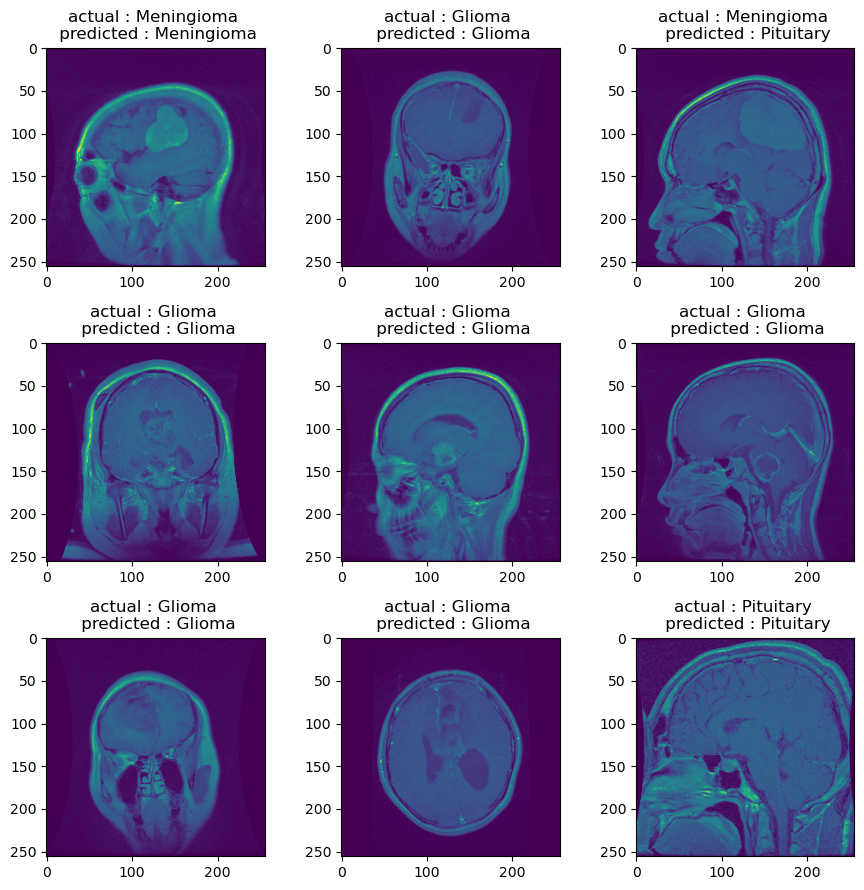

In [ ]:
prediction_test_sample(model,test_image)

### on val data

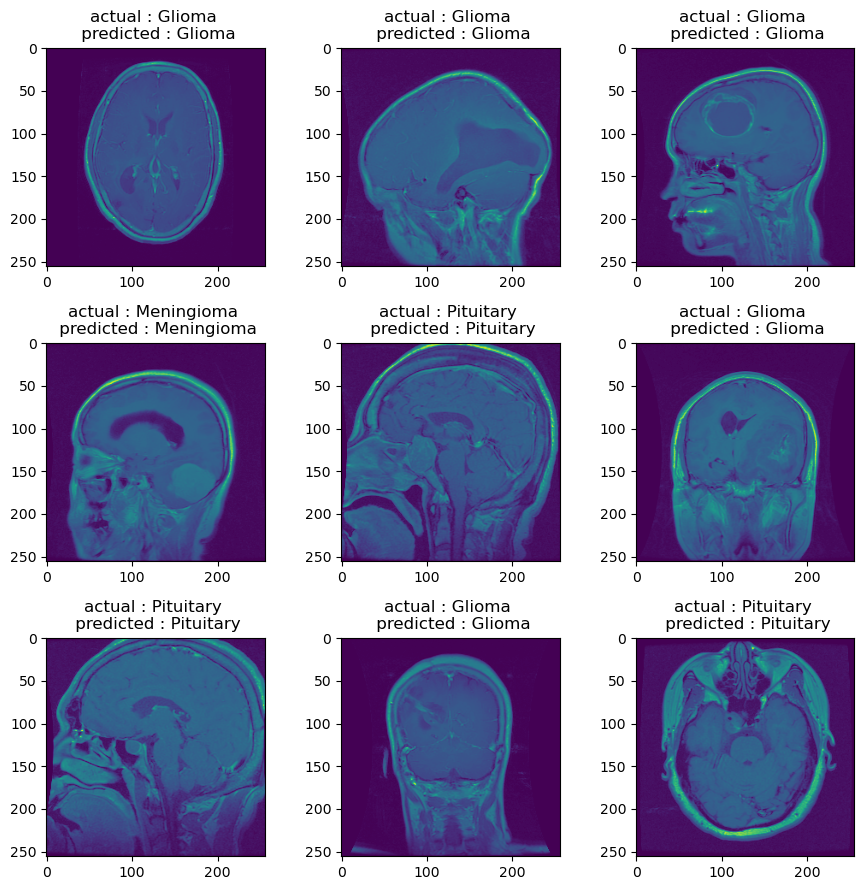

In [ ]:
prediction_test_sample(model,val_image)

- We can observe the prediction of the tumors from the mri scan images by the model

# Tranfer Learning
- We tried to use the UNET which is available in the keras segmentation models
- This UNET had been trained on Imagenet dataset for the segmentation

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1/255.0,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   brightness_range=(0.9,1.1),
                                   zoom_range=[0.9,1.1],
                                   fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1/255.0)
batch =16
#img
train_img = train_datagen.flow_from_directory(directory="/content/drive/MyDrive/Brain_Tumor_Data/segmentation/train/img",
                                              class_mode=None,
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False)

val_img = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/Brain_Tumor_Data/segmentation/val/img",
                                              class_mode=None,
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False)

test_img = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/Brain_Tumor_Data/segmentation/test/img",
                                              class_mode=None,
                                              batch_size=batch,
                                              seed = 909,
                                              shuffle=False,)

# mask
train_mask = train_datagen.flow_from_directory(directory="/content/drive/MyDrive/Brain_Tumor_Data/segmentation/train/mask",
                                              class_mode=None,
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

val_mask = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/Brain_Tumor_Data/segmentation/val/mask",
                                              class_mode=None,
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

test_mask = test_datagen.flow_from_directory(directory="/content/drive/MyDrive/Brain_Tumor_Data/segmentation/test/mask",
                                              class_mode=None,
                                              seed = 909,
                                              batch_size=batch,
                                              shuffle=False)

Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 1838 images belonging to 1 classes.
Found 613 images belonging to 1 classes.
Found 613 images belonging to 1 classes.


Transfer learning model using U net and using Resnet as backbone
- First we need to install this to get the UNET in keras

In [ ]:
!pip install git+https://github.com/qubvel/segmentation_models

  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-5nn6_d3_
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/segmentation_models /tmp/pip-req-build-5nn6_d3_
  Resolved https://github.com/qubvel/segmentation_models to commit e951c6747f75fa9e7240816d1c79dd2e66813123
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.7 MB/s eta 0:00:00
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33786 sha256=59eb966b2b3bfbe6d53f87a55de76c7ec265706ed2a6825bf6b69d579068a40f
  Stored in directory: /tmp/pip-ephem-wheel-cache-vhvpumru/wheels/ce/d6/f1/5d00e82b3893c5f1ffee43bf7b8877148af09c7c9c6c4882c9
Successfully built segmentation-models


- It's important to set the framework otherwise it will give the error

In [ ]:
import segmentation_models as sm

sm.set_framework('tf.keras')

sm.framework()

'tf.keras'

In [ ]:
Backbone = "resnet34"
preprocess_input = get_preprocessing(Backbone)

# preprocess input
train_image = preprocess_input(train_img)
val_image = preprocess_input(val_img)

# define model
model = Unet(Backbone , encoder_weights="imagenet",classes=1,activation="sigmoid",input_shape=(512, 512, 3))

model.compile(optimizer = Adam(learning_rate=1e-3), loss= sm.losses.BinaryFocalLoss(alpha=0.25, gamma=2.0)+sm.losses.BinaryCELoss()+sm.losses.DiceLoss(), metrics=["accuracy",iou_score])

85521592/85521592 [==============================] - 1s 0us/step


In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 512, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 518, 518, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                            

In [ ]:
checkpoint  = ModelCheckpoint('/content/drive/MyDrive/model_best_unet_pretrained1.h5',
                                    save_best_only=True,
                                    monitor='val_loss',
                                    mode='min',
                                    verbose=1)

# early_stop = EarlyStopping(monitor='val_loss',
#                                  patience=10,
#                                  mode='min',
#                                  restore_best_weights=True)

lr = ReduceLROnPlateau(patience=7,
                             verbose=2,
                             monitor='val_loss',
                             min_lr=1e-4,
                             mode='min',
                             restore_best_weights=True)

callback = [lr, checkpoint]

hist = model.fit(zip(train_image,train_mask),
                  epochs=100,
                  steps_per_epoch = len(train_image),
                  validation_data= zip(val_image, val_mask),
                  validation_steps=len(val_image),
                  validation_batch_size=16,
                  workers=-1,
                  use_multiprocessing=True,
                  callbacks = callback)

Epoch 1/100
115/115 [==============================] - ETA: 0s - loss: 0.9560 - accuracy: 0.9609 - iou_score: 0.1297
Epoch 1: val_loss improved from inf to 1.70214, saving model to /content/drive/MyDrive/model_best_unet_pretrained1.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


115/115 [==============================] - 1224s 10s/step - loss: 0.9560 - accuracy: 0.9609 - iou_score: 0.1297 - val_loss: 1.7021 - val_accuracy: 0.8308 - val_iou_score: 0.0167 - lr: 0.0010
Epoch 2/100
115/115 [==============================] - ETA: 0s - loss: 0.5501 - accuracy: 0.9784 - iou_score: 0.3700
Epoch 2: val_loss improved from 1.70214 to 1.07657, saving model to /content/drive/MyDrive/model_best_unet_pretrained1.h5
115/115 [==============================] - 103s 905ms/step - loss: 0.5501 - accuracy: 0.9784 - iou_score: 0.3700 - val_loss: 1.0766 - val_accuracy: 0.9808 - val_iou_score: 0.0258 - lr: 0.0010
Epoch 3/100
115/115 [==============================] - ETA: 0s - loss: 0.5022 - accuracy: 0.9799 - iou_score: 0.4213
Epoch 3: val_loss did not improve from 1.07657
115/115 [==============================] - 96s 839ms/step - loss: 0.5022 - accuracy: 0.9799 - iou_score: 0.4213 - val_loss: 1.1434 - val_accuracy: 0.9808 - val_iou_score: 0.0011 - lr: 0.0010
Epoch 4/100
115/115 [==

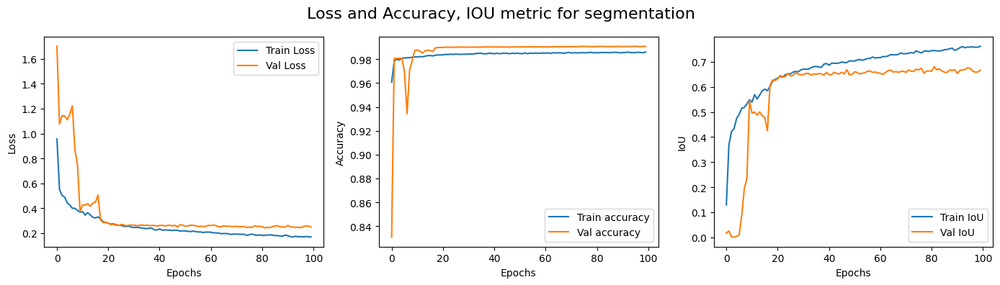

In [ ]:
f,ax = plt.subplots(1,3, figsize=(14, 4))
f.suptitle('Loss and Accuracy, IOU metric for segmentation', fontsize=16)

ax[0].plot(hist.history['loss'], label="Train Loss")
ax[0].plot(hist.history['val_loss'], label="Val Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")

ax[1].plot(hist.history['accuracy'], label="Train accuracy")
ax[1].plot(hist.history['val_accuracy'], label="Val accuracy")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")

ax[2].plot(hist.history['iou_score'], label="Train IoU")
ax[2].plot(hist.history['val_iou_score'], label="Val IoU")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("IoU")

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

In [ ]:
model.save("/content/drive/MyDrive/model_unet_pretrained1.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Inference**
- the mean iou for this is only 0.66 approximately which is lower than the models we did before we didn't proceed with this model for classification
- We think we are not getting good results because the model might be trained with the images from the Imagenet which is kind of pixel-wise balanced comapared to our tumor in the image
- So they may have not fine tuned it for that purpose but we need to check more about this and train for more epochs

# Function to Predict Tumor Region and Class
- Here, we have defined a function to segment the image and predict it's class using the model we have defined above

***INPUT PARAMETERS***

- image -> Scan image
- model1 ->  segmentation
- model2 ->  classification
- mask_img -> true mask image

In [ ]:
model1 = keras.models.load_model("Models/best_unet_model.h5",compile=False)
model2 = keras.models.load_model("Models/model_best_unet_clf.h5",compile=False)

In [ ]:
#### INPUT PARAMETERS ####

# image -> Scan image
# model1 ->  segmentation
# model2 ->  classification
# mask_img -> true mask image

def prediction(image, model1, model2, mask_img,org_label):

    labels = ['Glioma', 'Meningioma', 'Pituitary']

    seg = model1.predict(tf.reshape(image, shape=[1,256,256,1]))

    clf = model2.predict(tf.reshape(image, shape=[1,256,256,1]))
    acc = np.max(clf)
    label2 = labels[clf.argmax()]

    plt.figure(figsize=(14,6))

    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title(f'original image of {org_label}')

    plt.subplot(1,3,2)
    plt.imshow(mask_img)
    plt.title('original mask')

    plt.subplot(1,3,3)
    plt.imshow(seg[0][:,:,0])
    plt.title('predicted mask')

    plt.suptitle(f'predicted - {label2} with {acc:.2f} accuracy')

    plt.show()

In [ ]:
import cv2 as cv
def img_preprocess(img_path , mask_path):
    img = plt.imread(img_path)
    mask = plt.imread(mask_path)
    img = cv.resize(img,(256,256))
    mask = cv.resize(mask,(256,256))
    img = img/255.0
    mask = mask/255.0
    return img , mask

In [ ]:
img1 = "Prediction/Images/Glioma1.jpg"
mask1 = "Prediction/Mask/Glioma1.jpg"

In [ ]:
img , mask = img_preprocess(img1,mask1)

1/1 [==============================] - 0s 334ms/step


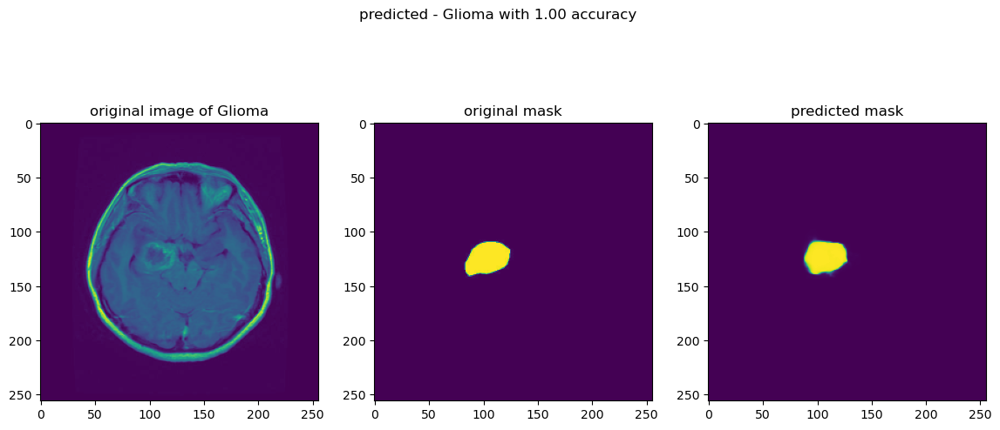

In [ ]:
prediction(img,model1,model2,mask,"Glioma")

In [ ]:
img2 = "Prediction/Images/Glioma2.jpg"
mask2 = "Prediction/Mask/Glioma2.jpg"

1/1 [==============================] - 0s 282ms/step


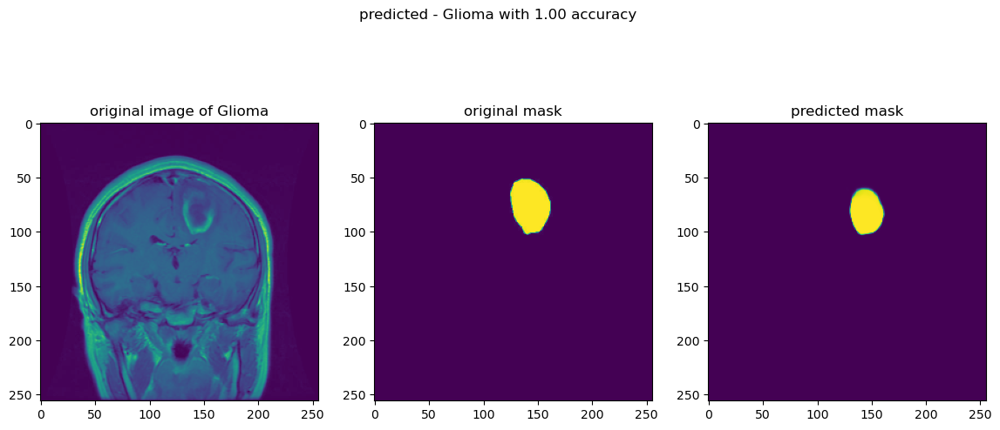

In [ ]:
img , mask = img_preprocess(img2,mask2)
prediction(img,model1,model2,mask,"Glioma")

In [ ]:
img2 = "Prediction/Images/Pituitary1.jpg"
mask2 = "Prediction/Mask/Pituitary1.jpg"

1/1 [==============================] - 0s 316ms/step


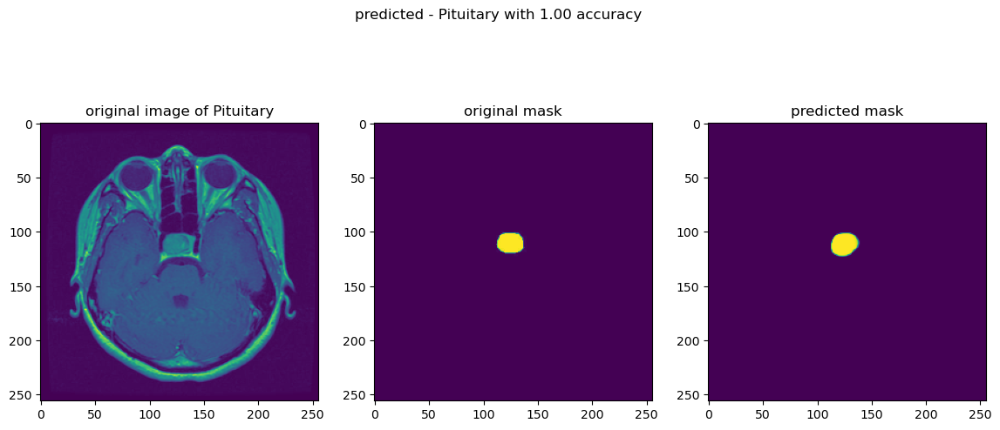

In [ ]:
img , mask = img_preprocess(img2,mask2)
prediction(img,model1,model2,mask,"Pituitary")

**Inference**
- We can observe that the model is segmenting the image and predicting it correctly.
- So, we can say that our model does reasonably good job

### Conclusion and Inferences
- Classification based on simple models doesn't give good results
- Using basic **AutoEncoder** we couldn't achieve the good Saliency map but we got good saliency map from UNET
architectures because of the skip connections they use to focus the region of interest i.e., tumor.
- We have used **Mean IOU** metric for segmentation because the tumor and non-tumor pixels are unbalanced.
- Addition of **three losses** (Binary cross-entropy, Focul loss, Dice Loss) gave much better result compared to using individual loss for segmentation.
- The model, **UNET with batch norm** and data augmentation gave the best result for the data.

### Improvements and future plans
- **Improve the Classification:**  \
We can try improving the classification part by analysing the incorrect labeled images and working on the classification fine tuning more since we focused on the segmentation more here
- **Improve the shape preservation**: \
We can improve the segmentation part by trying to preserve that shape of the tumor more since we observed that in some images the shape of the image is not preserved much since it preserves the location of the tumor more
-**Transfer learning:** \
We can improve the transfer learning using the UNET from keras by training it for more epochs since the graph keeps improving

# References
- U-Net: Convolutional Networks for Biomedical Image Segmentation (Olaf Ronneberger, Philipp Fischer, Thomas Brox)(https://doi.org/10.48550/arXiv.1505.04597)
-  https://blog.paperspace.com/unet-architecture-image-segmentation/
- Loss Functions: https://bmcmedinformdecismak.biomedcentral.com/articles/10.1186/s12911-021-01431-y